In [1]:
%matplotlib inline

import numpy as np
#import theano
import scipy.io
from keras.utils import np_utils
from matplotlib import pyplot as plt

#from keras.models import Sequential
from keras import layers
from keras.models import Model
from keras.layers import Dense, Dropout, Activation, Flatten
#from keras.layers import Convolution2D, MaxPooling2D
from keras.layers import MaxPooling2D

from keras.layers import Input, concatenate, Conv2D, UpSampling2D, Conv2DTranspose
from keras.layers import Input, merge, Conv2D, UpSampling2D
from keras.optimizers import Adam, sgd
from keras.callbacks import ModelCheckpoint
from keras.layers.normalization import BatchNormalization
#from keras import losses
from keras import backend as K
from keras.models import load_model


from os import listdir
from os.path import isfile, join
import numpy
import cv2
from matplotlib import pyplot as plt

import random

from os import listdir
from os.path import isfile, join
import numpy
import cv2
from matplotlib import pyplot as plt

import cPickle

Using Theano backend.


# Preprocessing functions

In [2]:
#mypath='/path/to/folder'
mypath1 = 'drivemod/test/original3'
mypath2 = 'drivemod/test/mask'


def load_files_raw(mypath):
    onlyfiles = [ f for f in listdir(mypath) if isfile(join(mypath,f)) ]
    images = numpy.empty(len(onlyfiles), dtype=object)
    for n in range(0, len(onlyfiles)):
      images[n] = cv2.imread( join(mypath,onlyfiles[n]), 0)
    return images


def load_files():

    inp_load0 = load_files_raw(mypath1)
    seg_load0 = load_files_raw(mypath2)

    images = inp_load0

    n, hv, wv = 20, 584, 565
    inp_load1 = np.zeros((n, hv, wv), dtype=np.float64)
    seg_load1 = np.zeros((n, hv, wv), dtype=np.uint8)

    for i in range(0, inp_load0.size):
        inp_load1[i] = inp_load0[i]           #(20L, 584L, 565L)
        seg_load1[i] = seg_load0[i]


    inp_load = inp_load1
    seg_load = seg_load1
    
    # inp_load = np.expand_dims(inp_load1, 3)   #(20L, 584L, 565L, 1L)
    # seg_load = np.expand_dims(seg_load1, 3)

    print('inp_load, seg_load', inp_load.shape)

    return inp_load, seg_load


def plot_ves_loads(sample, plot):

    inp = inp_load[sample]
    inp = inp.reshape(hv, wv)

    seg = seg_load[sample]
    seg = seg.reshape(hv, wv)

    if plot == 0:
        plt.figure(figsize=(15, 15))
        plt.imshow(inp, cmap=plt.get_cmap('gray'))
        plt.axis('off')
    
    if plot == 1:
        plt.figure(figsize=(15, 15))
        plt.imshow(seg, cmap=plt.get_cmap('gray'))
        plt.axis('off')
    
    if plot == 2:
        plt.figure(figsize=(15, 15))
        plt.subplot(1,2,1)
        plt.imshow(inp, cmap=plt.get_cmap('gray'))
        plt.subplot(1,2,2)
        plt.imshow(seg, cmap=plt.get_cmap('gray'))
        plt.axis('off')
        
    if plot == 3:
        plt.figure(figsize=(30, 30))
        plt.subplot(2,1,1)
        plt.imshow(inp, cmap=plt.get_cmap('gray'))
        plt.subplot(2,1,2)
        plt.imshow(seg, cmap=plt.get_cmap('gray'))
        plt.axis('off')
        
def plot_ves_crops(sample, plot):

    inp = inp_cr[sample]
    inp = inp.reshape(hc, wc)

    seg = seg_cr[sample]
    seg = seg.reshape(hc, wc)

    if plot == 0:
        plt.figure(figsize=(15, 15))
        plt.imshow(inp, cmap=plt.get_cmap('gray'))
        plt.axis('off')
    
    if plot == 1:
        plt.figure(figsize=(15, 15))
        plt.imshow(seg, cmap=plt.get_cmap('gray'))
        plt.axis('off')
    
    if plot == 2:
        plt.figure(figsize=(15, 15))
        plt.subplot(1,2,1)
        plt.imshow(inp, cmap=plt.get_cmap('gray'))
        plt.subplot(1,2,2)
        plt.imshow(seg, cmap=plt.get_cmap('gray'))
        plt.axis('off')
        
    if plot == 3:
        plt.figure(figsize=(30, 30))
        plt.subplot(2,1,1)
        plt.imshow(inp, cmap=plt.get_cmap('gray'))
        plt.subplot(2,1,2)
        plt.imshow(seg, cmap=plt.get_cmap('gray'))
        plt.axis('off')
        
def random_crop(inputs, targets, num_targets=1, width=128, height=128):
    "Create random crop from an image and its targets"
    #inputs = numpy array of shape [row, col]
    #targets = numpy array of targets [row, col] or [row, col][row, col]
    #num_targets = number of targets
    #width = width of crop
    #height = height of crop
    row = inputs.shape[0]
    col = inputs.shape[1]

    blank = 1
    #while blank:
    x = random.randint(0, row-width-1)
    y = random.randint(0, col-height-1)

    input_crop = inputs[x:x+width, y:y+height]
    if num_targets == 1:
        target_crop = targets[x:x+width, y:y+height]
        if np.max(target_crop) == 1:
            blank = 0
    elif num_targets == 2:
        target1 = targets[0]
        target2 = targets[1]
        target1 = target1[x:x+width, y:y+height]
        target2 = target2[x:x+width, y:y+height]
        target_crop = [target1, target2]
        if np.max(target1) == 1 or np.max(target2) == 1:
            blank = 0
    return input_crop, target_crop
        
    
def crop_set(numcrop, inp_load, seg_load, hc, wc):
    
    inp_cr = np.zeros((numcrop, hc, wc), dtype=np.float64)
    seg_cr = np.zeros((numcrop, hc, wc), dtype=np.uint8)

    for i in range(0, numcrop):
        n = random.randint(0, len(inp_load)-1)
        inp_cr0, seg_cr0 = random_crop(
            inp_load[n], 
            seg_load[n], 1, hc, wc)
        
        #print('inp_cr0', inp_cr0.shape)
        #print('i', i)
        inp_cr[i,:,:] = inp_cr0
        seg_cr[i,:,:] = seg_cr0
        
    return inp_cr, seg_cr

# Plot functions

In [3]:

def plot_preds(pred, x_test, y_test, sample, thresh, threshon):  
    print(pred.shape)   # (20L, 28L, 28L, 1L)
    #test = #x_test[sample,:,:,:].reshape(w,h)
    test = pred[sample,:,:,:]
    print(test.shape)
    test2 = test.reshape(w,h)
    print(test2.shape)

#     if threshon == 0:
#         thresh = (np.max(test) - np.min(test))/2

    print('threshold:', thresh, 'usage:', threshon)
    print('min and max predicted values:',np.min(test), np.max(test))
    #plt.imshow(test2>thresh, cmap=plt.get_cmap('gray'))
    plt.subplot(1,4,1)
    if threshon == 0:
        plt.imshow(test2, cmap=plt.get_cmap('gray'))
        title = 'Prediction'
    if threshon == 1:
        plt.imshow(test2>thresh, cmap=plt.get_cmap('gray'))
        title = 'Prediction Thresholded'
    plt.tight_layout()
    plt.title(title)
    plt.axis('off')
    plt.show()

    plt.subplot(1,4,2)
    plt.imshow(y_test[sample,:,:,:].reshape(w,h), cmap=plt.get_cmap('gray'))
    plt.tight_layout()
    plt.title('Target')
    plt.axis('off')
    plt.show()

    plt.subplot(1,4,3)
    plt.imshow(x_test[sample,:,:,:].reshape(w,h), cmap=plt.get_cmap('gray'))
    plt.tight_layout()
    plt.title('Original')
    plt.axis('off')
    plt.show()

    
def plot_preds_b(pred, x_test, y_test, sample, view, thresh):

    test = pred[sample,:,:,:].reshape(w,h)
    #test2 = test>0.55
    test2 = test>thresh
    
    if view == 1:
        plt.figure(figsize=(16, 16))
        plt.subplot(1,4,1)
        plt.imshow(test, cmap=plt.get_cmap('gray'))
        plt.title('Prediction')
        plt.axis('off')
        plt.subplot(1,4,2)
        plt.imshow(test2, cmap=plt.get_cmap('gray'))
        plt.title('Thresholded at %s' %thresh)
        plt.axis('off')
        plt.subplot(1,4,3)
        plt.imshow(y_test[sample,:,:,:].reshape(w,h), cmap=plt.get_cmap('gray'))
        plt.title('Target')
        plt.axis('off')
        plt.subplot(1,4,4)
        plt.imshow(x_test[sample,:,:,:].reshape(w,h), cmap=plt.get_cmap('gray'))
        plt.title('Original')
        plt.axis('off')

    if view == 2:
        plt.figure(figsize=(16, 16))
        plt.subplot(2,2,1)
        plt.imshow(test, cmap=plt.get_cmap('gray'))
        plt.title('Prediction')
        plt.axis('off')
        plt.subplot(2,2,2)
        plt.imshow(test2, cmap=plt.get_cmap('gray'))
        plt.title('Thresholded at %s' %thresh)
        plt.axis('off')
        plt.subplot(2,2,4)
        plt.imshow(y_test[sample,:,:,:].reshape(w,h), cmap=plt.get_cmap('gray'))
        plt.title('Target')
        plt.axis('off')
        plt.subplot(2,2,3)
        plt.imshow(x_test[sample,:,:,:].reshape(w,h), cmap=plt.get_cmap('gray'))
        plt.title('Original')
        plt.axis('off')

        
def plot_preds_c(pred):
    
    num = pred.shape[0]
    
    plt.figure(figsize=(16, 20))
    for i in range(1, num+1):
        plt.subplot(5,4,i)
        plt.imshow(pred[i-1,:,:,:].reshape(w,h), cmap=plt.get_cmap('gray'))
        plt.axis('off')
      
    
def plot_preds_d(pred, thresh):
    
    num = pred.shape[0] 
    
    plt.figure(figsize=(16, 20))
    for i in range(1, num+1):
        plt.subplot(5,4,i)
        plt.imshow(pred[i-1,:,:,:].reshape(w,h)> thresh, cmap=plt.get_cmap('gray'))
        plt.axis('off')

# Preprocessing

In [4]:
hv, wv =  584, 565
hc, wc = 128, 128

inp_load, seg_load = load_files()
#cropnum = 40  #20,20
cropnum = 240  #220
inp_cr, seg_cr = crop_set(cropnum, inp_load, seg_load, hc, wc)

('inp_load, seg_load', (20L, 584L, 565L))


('raw id:', 16, 'crop id:', 89)


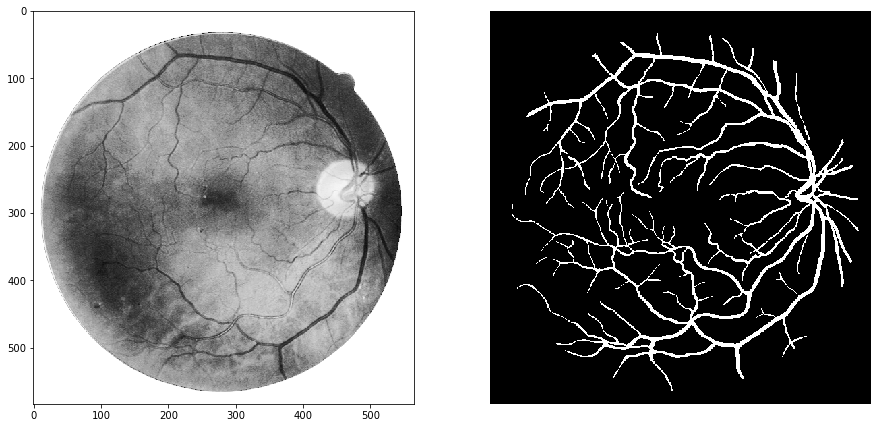

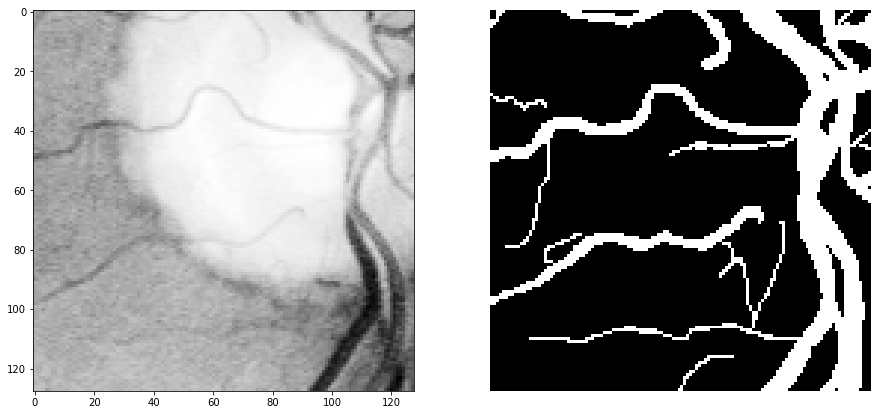

In [17]:
show1 = random.randint(0, 19)
show2 = random.randint(0, cropnum-1)
print('raw id:', show1, 'crop id:', show2)
plot_ves_loads(show1, 2)
plot_ves_crops(show2, 2)

# CNN functions

In [5]:
w, h = 128, 128
inputs = Input((w, h, 1))
net_num = '1'
batch_num = 8
epoch_num = 15
thresh = 0.65
threshon = 0
sample = 0
#thresh = 0.5
loss_type  = 'binary'

def train_model(net_num, get_unet0, batch_num, epoch_num, indcoef):

    checkpath = 'checkpoints/ves_' + net_num + '.best.h5'
    modelpath = 'models/ves_' + net_num + '.h5'
    weightpath = 'weights/ves_' + net_num + '.h5'

    model = get_unet0(Input((w,h,1)), indcoef)
    #print(type(model))
    #checkpoint = ModelCheckpoint(checkpath, monitor='val_loss', save_best_only=True)
    
    history = model.fit(x_train, y_train,
          batch_size=batch_num, epochs=epoch_num, 
          verbose=1, shuffle=True,
          validation_split=0.2, 
     #     callbacks=[checkpoint]
         )

#     model.save(modelpath)
#     model.save_weights(weightpath)
    
    #plot_history(history, indcoef)
    
    return model, history


def compiler_loss(indcoef):

    #if indcoef == 0:
    if indcoef == 'binary':
        #typecoeff = 'acc'
        typecoeff = 'binary_crossentropy'
        valcoeff = 'accuracy'
    
    #if indcoef == 1:
    if indcoef == 'dice':
#         typecoeff = 'dice_coef'
#         valcoeff = 'val_dice_coef'
        typecoeff = dice_coef_loss
        valcoeff = dice_coef
        
    #if indcoef == 2:
    if indcoef == 'weighted':
        typecoeff = weighted_crossentropy_loss
        valcoeff = weighted_crossentropy_coeff
        
    return typecoeff, valcoeff

        
def plot_history(history, indcoef):
    
    #if indcoef == 0:
    if indcoef == 'binary':
        typecoeff = 'acc'
        valcoeff = 'val_acc'
    
    #if indcoef == 1:
    if indcoef == 'dice':
        typecoeff = 'dice_coef'
        valcoeff = 'val_dice_coef'
        
    #if indcoef == 2:
    if indcoef == 'weighted':
        typecoeff = 'weighted_crossentropy_coeff'
        valcoeff = 'val_weighted_crossentropy_coeff'
        
#     typecoeff = choose_loss(indcoef)[0]
#     valcoeff = choose_loss(indcoef)[1]
           
    # summarize history for accuracy
    plt.plot(history.history[typecoeff])
    plt.plot(history.history[valcoeff])
    plt.title('model accuracy')
    plt.ylabel('accuracy')
    plt.xlabel('epoch')
    plt.legend(['train', 'val'], loc='upper left')
    plt.show()
    # summarize history for loss
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'val'], loc='upper left')
    plt.show()

    
def predict(model, x_test):
    pred = model.predict(x_test, verbose=1)
    return pred
    
    
    
    
def print_scores():
    num_test = (X_test.shape[0])
    test_score = np.zeros(num_test)

    for i in np.arange(num_test):
        mask = imgs_mask_test[i]
        test_score[i] = np.sum(y_test[i]-mask)
    mean_score = np.mean(test_score)
    print('test scores:', test_score)
    print('mean test score:', mean_score)
    
    
def save_data(thing, thingname):

    savepath = 'data/'
    cPickle.dump(thing, open(savepath + thingname + '.npy', "wb" ))
    
#     thing.save(savepath + thingname + '.npy', CXY)
#     thing.savetxt(savepath + thingname + '.npy', CXY)
     #cPickle.dump(thing, open( "filename.pkl", "wb" ) ) 
#     pred_5.save('maximums.npy', CXY)
#     np.savetxt('maximums.txt', CXY)

def load_data(thingname):
    savepath = 'data/'
    ploaded = cPickle.load( open( savepath + thingname + '.npy', "rb" ) )
    return ploaded
    


In [6]:
import theano.tensor as T
def weighted_dice_coeff(y_true, y_pred):
    y_true = K.flatten(y_true)
    y_pred = K.flatten(y_pred)
    weights = y_true * class_weights[0] 
    temp = T.eq(y_true, 0)
    temp = T.cast(temp, 'float32')
    temp = temp * class_weights[1]
    weights = weights + temp

    intersection = K.sum((y_true_f * y_pred_f)*weights)
    loss = (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)

    return loss

def weighted_dice_loss(y_true, y_pred):
    return -weighted_dice_coeff(y_true, y_pred)

def weighted_crossentropy_coeff(y_true, y_pred):
    y_true = K.flatten(y_true)
    y_pred = K.flatten(y_pred)
    weights = y_true * class_weights[0] 
    temp = T.eq(y_true, 0)
    temp = T.cast(temp, 'float32')
    temp = temp * class_weights[1]
    weights = weights + temp

    epsilon = 10e-8
    y_true = T.clip(y_true, epsilon, 1. - epsilon)
    coeff = K.sum(((y_true * K.log(y_pred))*weights))
    return coeff

def weighted_crossentropy_loss(y_true, y_pred):
    return -weighted_crossentropy_coeff(y_true, y_pred)

def cal_weights_4loss(y_true):
    size = y_true.shape[1] * y_true.shape[0]
    percentage_back = 0.0
    percentage_fore = 0.0
    percentage_back = np.count_nonzero(y_true == 0)/size*100
    percentage_fore = np.count_nonzero(y_true == 1)/size*100
    weight_back = np.reciprocal(percentage_back)
    weight_fore = np.reciprocal(percentage_fore)
    #print(percentage_back, percentage_fore)
    return percentage_back, percentage_fore

In [7]:
def get_seg(inputs, lossind):
#def get_unet1v3(inputs, lossind):

    inputs = Input((w, h, 1))
    conv1 = Conv2D(32, (3, 3), activation='relu', padding='same')(inputs)
    pool1 = MaxPooling2D(pool_size=(2, 2), padding='same')(conv1)
    up1 = concatenate([UpSampling2D(size=(2, 2))(pool1), conv1], axis=-1)
    conv2 = Conv2D(32, (3, 3), activation='relu', padding='same')(conv1)
    
    conv3 = Conv2D(1, (3, 3), activation='sigmoid', padding='same', name='conv6')(conv1)
    
    model = Model(inputs=[inputs], outputs=[conv3])

   # model.compile(optimizer=Adam(lr=1e-5), loss=dice_coef_loss, metrics=[dice_coef])
    model.compile(optimizer=Adam(lr=1e-5), loss=compiler_loss(lossind)[0], metrics=[compiler_loss(lossind)[1]])
    
    return model


In [9]:
weight_back = np.zeros((y_test.shape[0]))
weight_fore = np.zeros((y_test.shape[0]))

for i in np.arange(y_test.shape[0]):
    weight_back[i], weight_fore[i] = cal_weights_4loss(y_test[i])

print(weight_back, weight_fore)

loss_back = np.mean(weight_back)
loss_fore = np.mean(weight_fore)

ratio = loss_back/loss_fore

#class_weights = [1.5, 1.5/ratio]
class_weights = [0.8, 0.2]
print(loss_back, loss_fore, ratio, class_weights)

NameError: name 'y_test' is not defined

In [8]:
smooth = 1.

def dice_coef(y_true, y_pred):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)


def dice_coef_loss(y_true, y_pred):
    return -dice_coef(y_true, y_pred)


def get_unet1(inputs, lossind):
    inputs = Input((w, h, 1))
    conv1 = Conv2D(32, (3, 3), activation='relu', padding='same')(inputs)
    conv1 = Conv2D(32, (3, 3), activation='relu', padding='same')(conv1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = Conv2D(64, (3, 3), activation='relu', padding='same')(pool1)
    conv2 = Conv2D(64, (3, 3), activation='relu', padding='same')(conv2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)

    conv3 = Conv2D(128, (3, 3), activation='relu', padding='same')(pool2)
    conv3 = Conv2D(128, (3, 3), activation='relu', padding='same')(conv3)
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)

    conv4 = Conv2D(256, (3, 3), activation='relu', padding='same')(pool3)
    conv4 = Conv2D(256, (3, 3), activation='relu', padding='same')(conv4)
    pool4 = MaxPooling2D(pool_size=(2, 2))(conv4)

    conv5 = Conv2D(512, (3, 3), activation='relu', padding='same')(pool4)
    conv5 = Conv2D(512, (3, 3), activation='relu', padding='same')(conv5)

    up6 = concatenate([Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(conv5), conv4], axis=3)
    conv6 = Conv2D(256, (3, 3), activation='relu', padding='same')(up6)
    conv6 = Conv2D(256, (3, 3), activation='relu', padding='same')(conv6)

    up7 = concatenate([Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(conv6), conv3], axis=3)
    conv7 = Conv2D(128, (3, 3), activation='relu', padding='same')(up7)
    conv7 = Conv2D(128, (3, 3), activation='relu', padding='same')(conv7)

    up8 = concatenate([Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(conv7), conv2], axis=3)
    conv8 = Conv2D(64, (3, 3), activation='relu', padding='same')(up8)
    conv8 = Conv2D(64, (3, 3), activation='relu', padding='same')(conv8)

    up9 = concatenate([Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(conv8), conv1], axis=3)
    conv9 = Conv2D(32, (3, 3), activation='relu', padding='same')(up9)
    conv9 = Conv2D(32, (3, 3), activation='relu', padding='same')(conv9)

    conv10 = Conv2D(1, (1, 1), activation='sigmoid')(conv9)

    model = Model(inputs=[inputs], outputs=[conv10])

    model.compile(optimizer=Adam(lr=1e-5), loss=dice_coef_loss, metrics=[dice_coef])

    return model

# CNN code

In [9]:
x_load = np.expand_dims(inp_cr, 3)
y_load = np.expand_dims(seg_cr, 3)

#trainnum = 20
trainnum = 220

x_train = x_load[:trainnum] 
y_train = y_load[:trainnum]

x_test = x_load[trainnum:]
y_test = y_load[trainnum:]

print('x_load :', x_load.shape)
print('x_train:', x_train.shape)
print('x_test :', x_test.shape)

('x_load :', (240L, 128L, 128L, 1L))
('x_train:', (220L, 128L, 128L, 1L))
('x_test :', (20L, 128L, 128L, 1L))


In [10]:
x_train_large = x_load[:trainnum] 
y_train_large = y_load[:trainnum]

x_train_small = x_load[:20] 
y_train_small = y_load[:20]

print('x_train_small:', x_train_small.shape)

('x_train_small:', (20L, 128L, 128L, 1L))


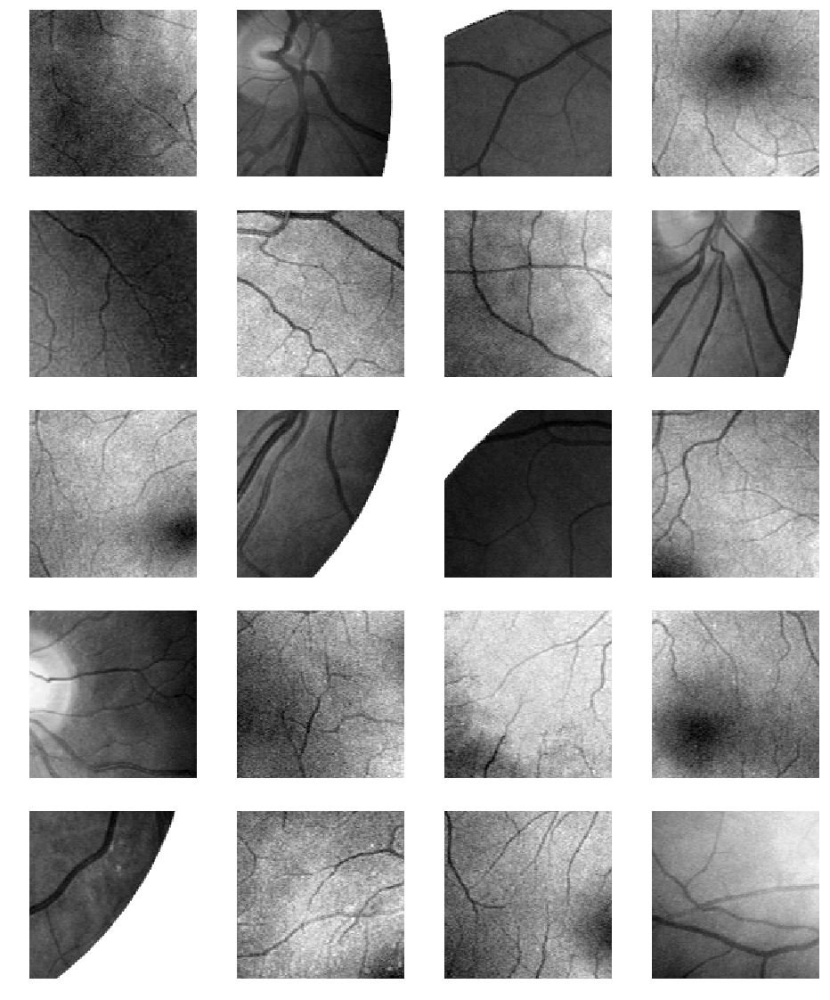

In [49]:
plot_preds_c(x_test)

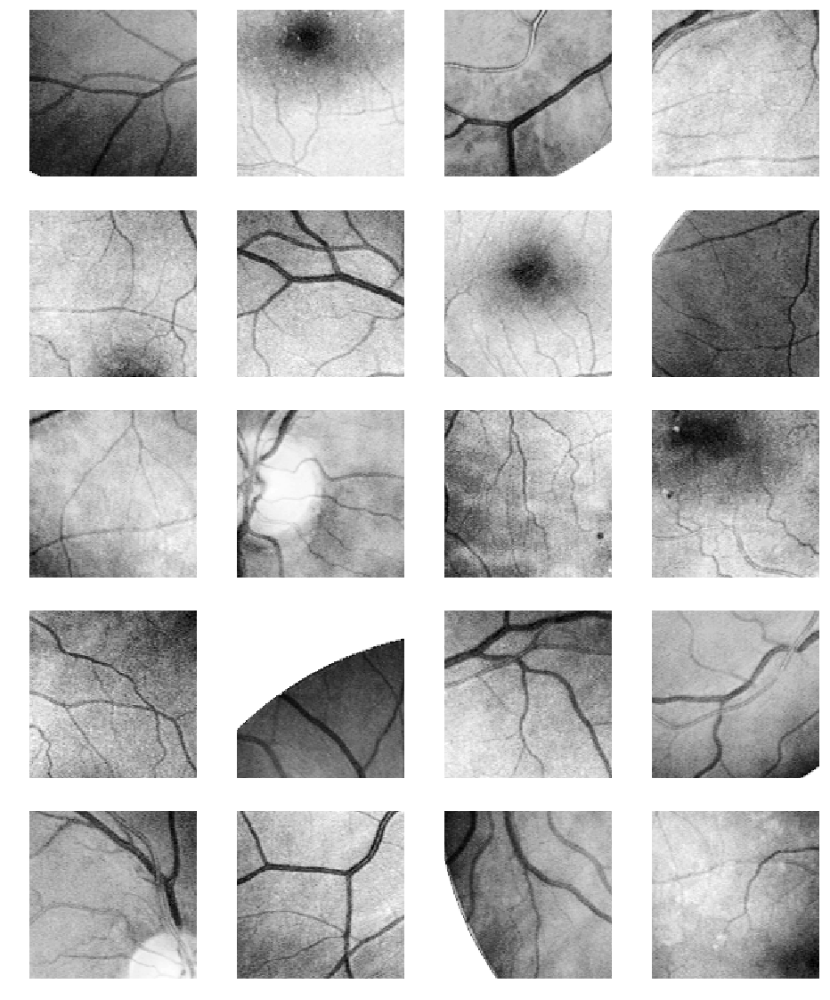

In [13]:
plot_preds_c(x_test)

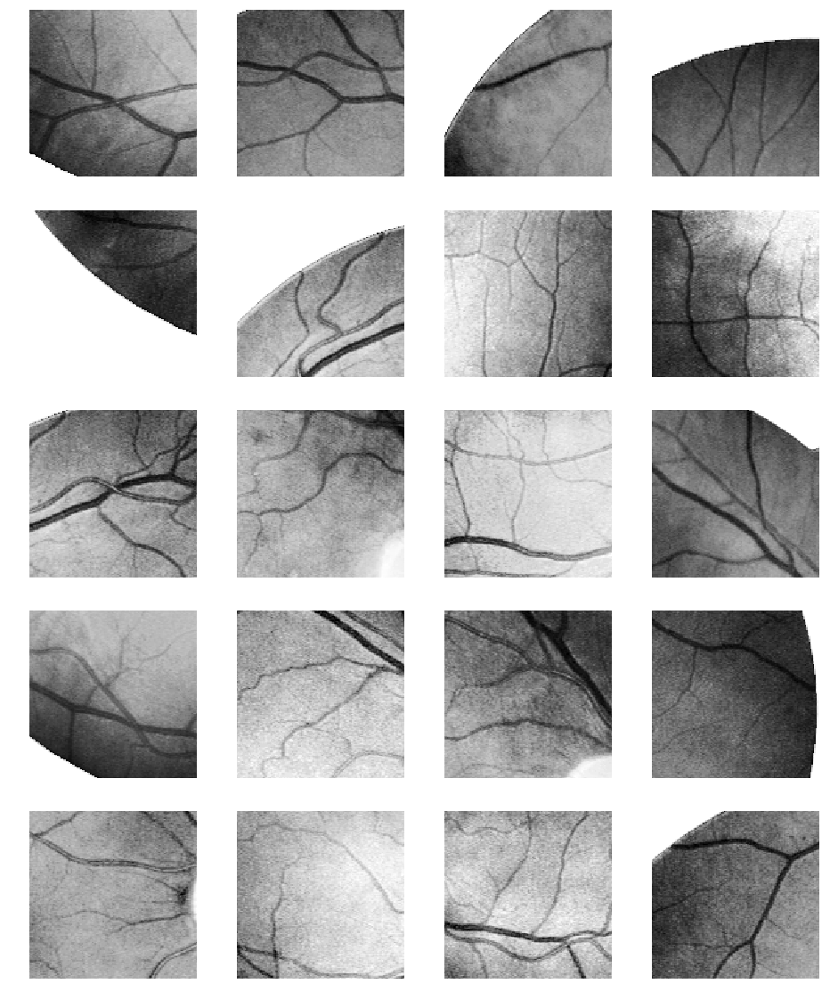

In [24]:
plot_preds_c(x_test)

In [14]:
#model, history = train_model(net_num, get_unet0, batch_num, epoch_num, indcoef):
loss_type = 'binary'
#loss_type = 'weighted'
model_1, history_1 = train_model('1', get_seg, 8, 6, loss_type)

Train on 176 samples, validate on 44 samples
Epoch 1/6
176/176 [==============================] - 4s - loss: 475.1052 - acc: 0.8820 - val_loss: 475.8082 - val_acc: 0.8812
Epoch 2/6
176/176 [==============================] - 4s - loss: 473.2555 - acc: 0.8820 - val_loss: 473.5667 - val_acc: 0.8811
Epoch 3/6
176/176 [==============================] - 4s - loss: 470.9930 - acc: 0.8819 - val_loss: 470.4646 - val_acc: 0.8811
Epoch 4/6
176/176 [==============================] - 4s - loss: 467.9154 - acc: 0.8819 - val_loss: 466.2836 - val_acc: 0.8810
Epoch 5/6
176/176 [==============================] - 5s - loss: 463.7423 - acc: 0.8816 - val_loss: 460.3439 - val_acc: 0.8806
Epoch 6/6
176/176 [==============================] - 5s - loss: 457.8081 - acc: 0.8807 - val_loss: 451.9280 - val_acc: 0.8787


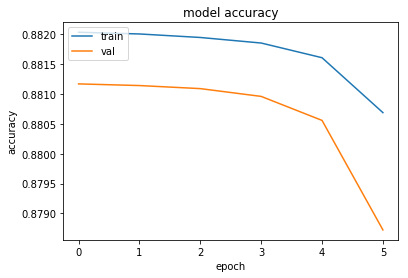

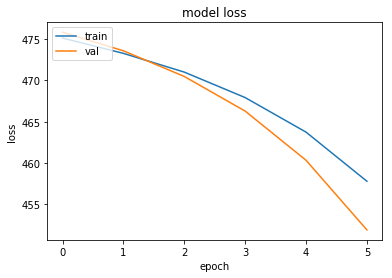

20/20 [==============================] - 0s


In [15]:
plot_history(history_1, loss_type)
pred_1 = predict(model_1, x_test)
#model_1.save('models/ves_1.h5')

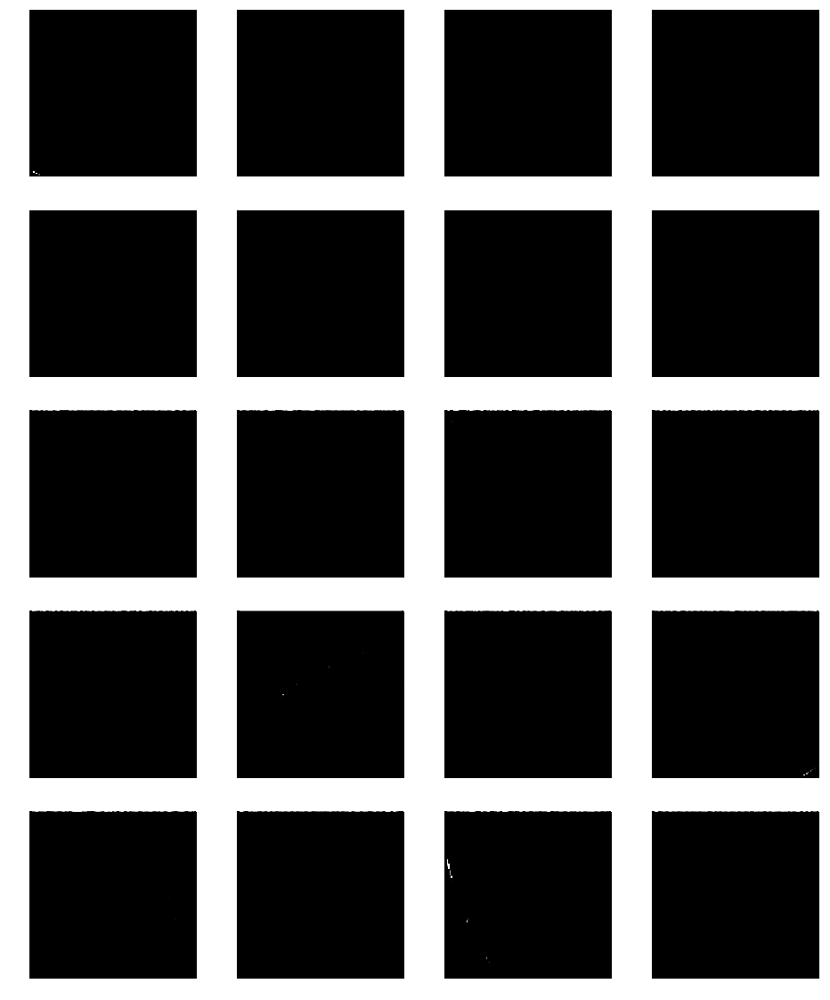

In [16]:
sample = 0
#plot_preds(pred_1, x_test, y_test, sample, thresh, 0)
plot_preds_c(pred_1)


In [11]:
def get_unet1v5(inputs, lossind):

    inputs = Input((w, h, 1))
    conv1 = Conv2D(32, (3, 3), activation='relu', padding='same')(inputs)
    pool1 = MaxPooling2D(pool_size=(2, 2), padding='same')(conv1)
    up1 = concatenate([UpSampling2D(size=(2, 2))(pool1), conv1], axis=-1)
    conv2 = Conv2D(32, (3, 3), activation='relu', padding='same')(up1)
    conv3 = Conv2D(32, (3, 3), activation='sigmoid', padding='same')(conv2)
    conv3 = BatchNormalization(axis=-1)(conv3)
    conv4 = Conv2D(1, (3, 3), activation='sigmoid', padding='same')(conv3)
    
    model = Model(inputs=[inputs], outputs=[conv4])

   # model.compile(optimizer=Adam(lr=1e-5), loss=dice_coef_loss, metrics=[dice_coef])
    model.compile(optimizer=Adam(lr=1e-5), loss=compiler_loss(lossind)[0], metrics=[compiler_loss(lossind)[1]])#/, sample_weight_mode="temporal")
    
    return model


In [18]:
loss_type = 'binary'
model_4v1, history_4v1 = train_model('4v1', get_unet1v5, 8, 15, loss_type)

Train on 176 samples, validate on 44 samples
Epoch 1/15
176/176 [==============================] - 39s - loss: -2.6136 - acc: 0.6173 - val_loss: 11.9879 - val_acc: 0.8668
Epoch 2/15
176/176 [==============================] - 40s - loss: -6.7176 - acc: 0.6220 - val_loss: 8.5232 - val_acc: 0.8531
Epoch 3/15
176/176 [==============================] - 42s - loss: -10.2691 - acc: 0.6103 - val_loss: 5.2328 - val_acc: 0.8275
Epoch 4/15
176/176 [==============================] - 40s - loss: -13.7812 - acc: 0.5994 - val_loss: 0.6736 - val_acc: 0.7274
Epoch 5/15
176/176 [==============================] - 41s - loss: -17.0530 - acc: 0.5836 - val_loss: -1.1719 - val_acc: 0.6982
Epoch 6/15
176/176 [==============================] - 41s - loss: -20.4170 - acc: 0.5912 - val_loss: -4.8227 - val_acc: 0.6374
Epoch 7/15
176/176 [==============================] - 41s - loss: -24.2528 - acc: 0.5829 - val_loss: -11.0378 - val_acc: 0.5474
Epoch 8/15
176/176 [==============================] - 41s - loss: -29.

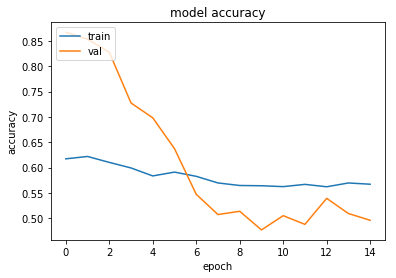

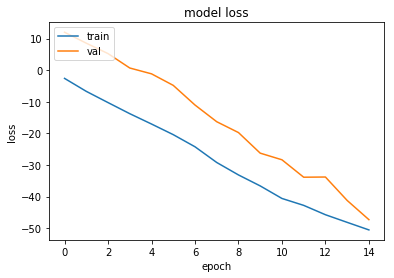

20/20 [==============================] - 1s


In [19]:
plot_history(history_4v1, 'binary')
pred_4v1 = predict(model_4v1, x_test)
#model4v5.save('models/ves4v1.h5')

In [14]:
loss_type = 'binary'
model_8v1, history_8v1 = train_model('8v1', get_unet1v5, 8, 3, loss_type)
pred_8v1 = predict(model_8v1, x_test)

Train on 176 samples, validate on 44 samples
Epoch 1/3
176/176 [==============================] - 40s - loss: 4.1722 - acc: 0.3540 - val_loss: -13.5966 - val_acc: 0.0093
Epoch 2/3
176/176 [==============================] - 42s - loss: -6.6101 - acc: 0.5672 - val_loss: -13.0306 - val_acc: 0.0153
Epoch 3/3
20/20 [==============================] - 1s


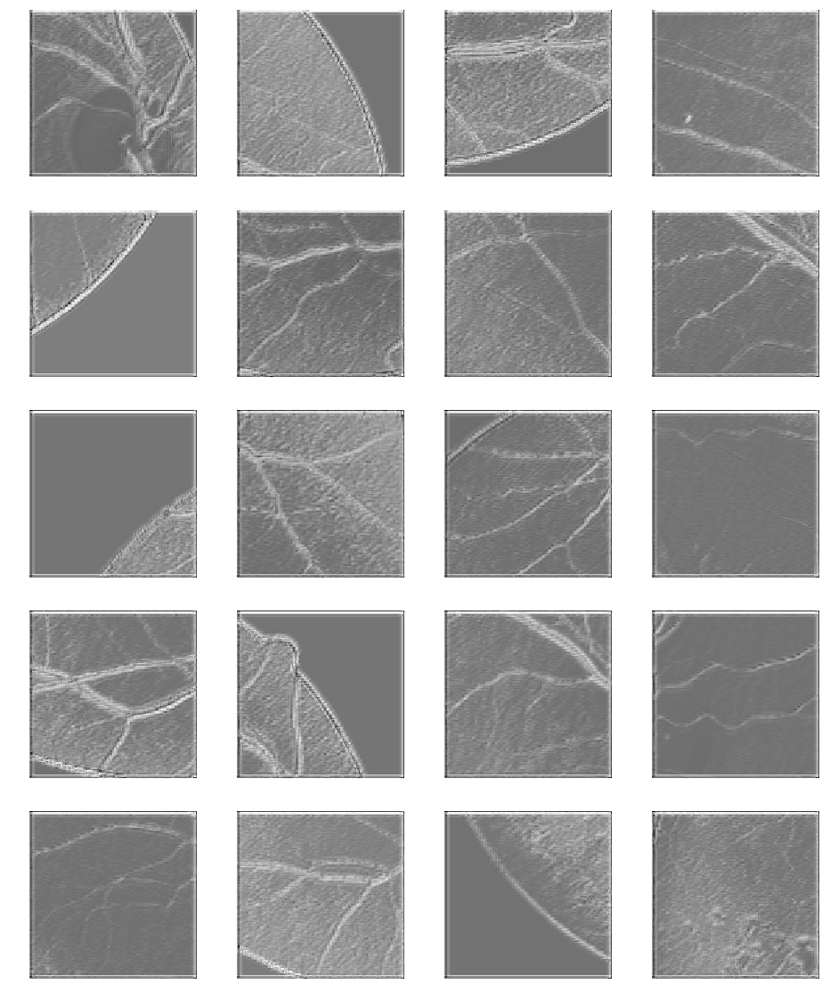

In [16]:
plot_preds_c(pred_8v1)

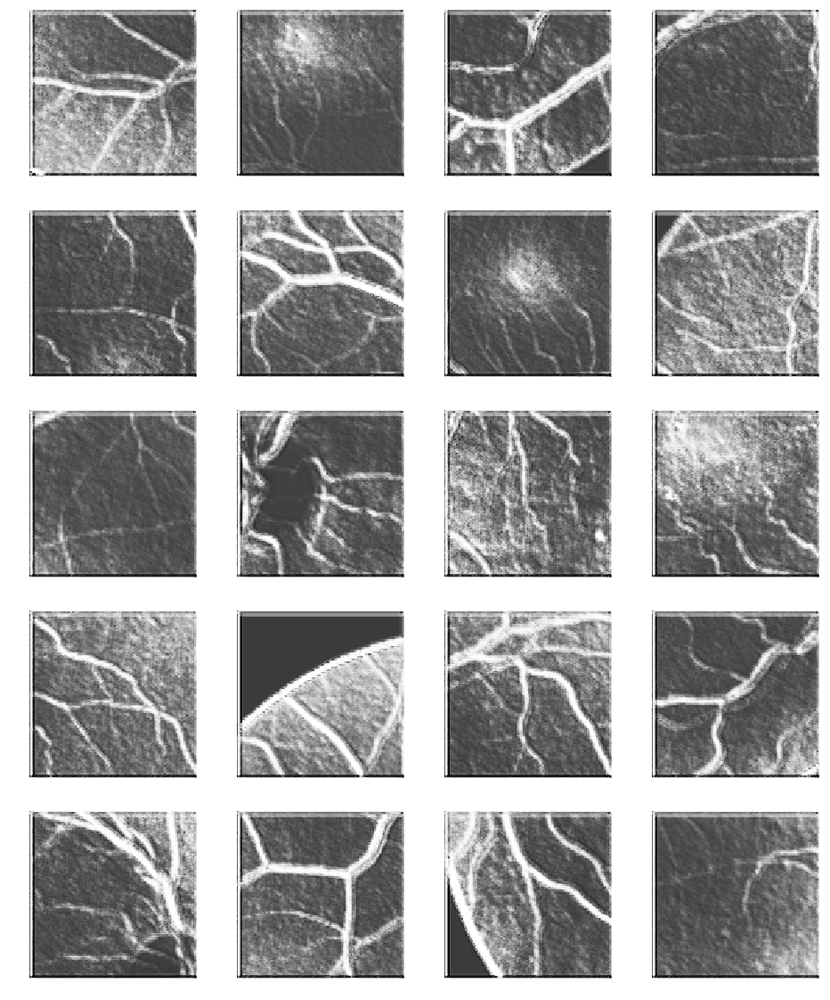

In [20]:
plot_preds_c(pred_4v1)

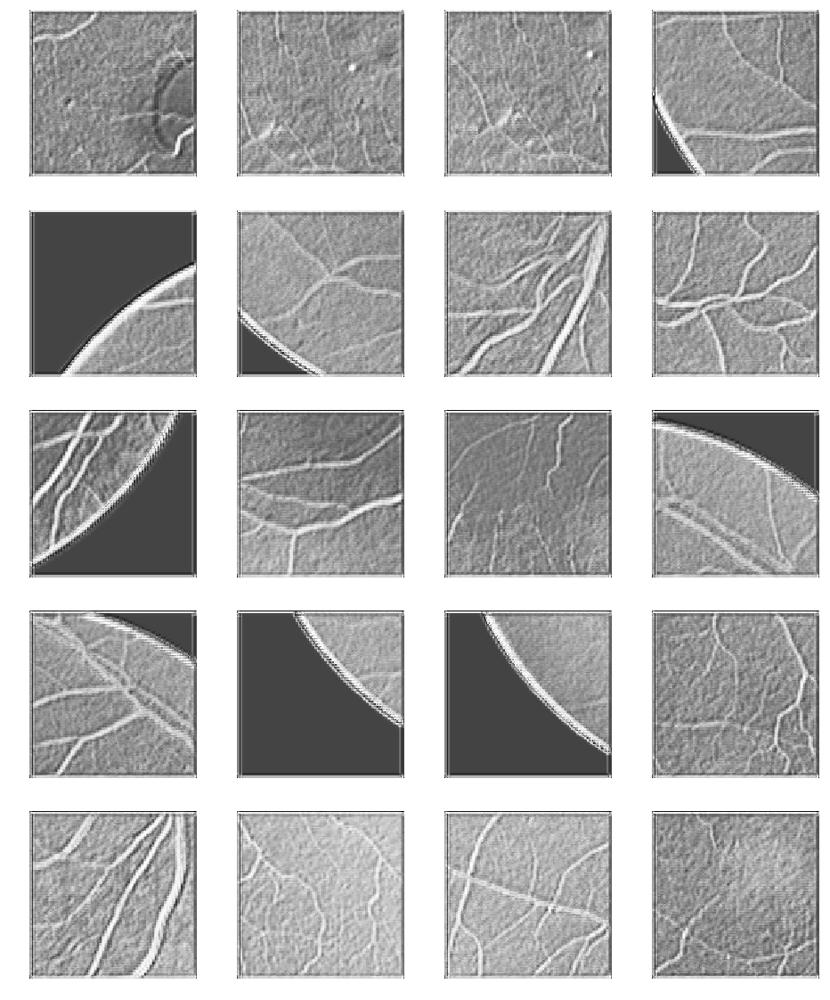

In [51]:
plot_preds_c(pred_4v1)

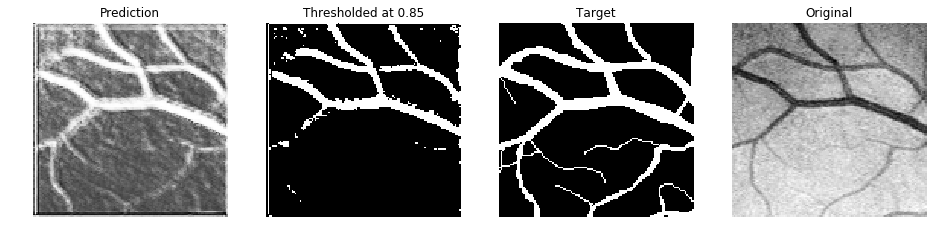

In [34]:
sample = 5
view = 1
thresh = 0.85
plot_preds_b(pred_4v1, x_test, y_test, sample, view, thresh)

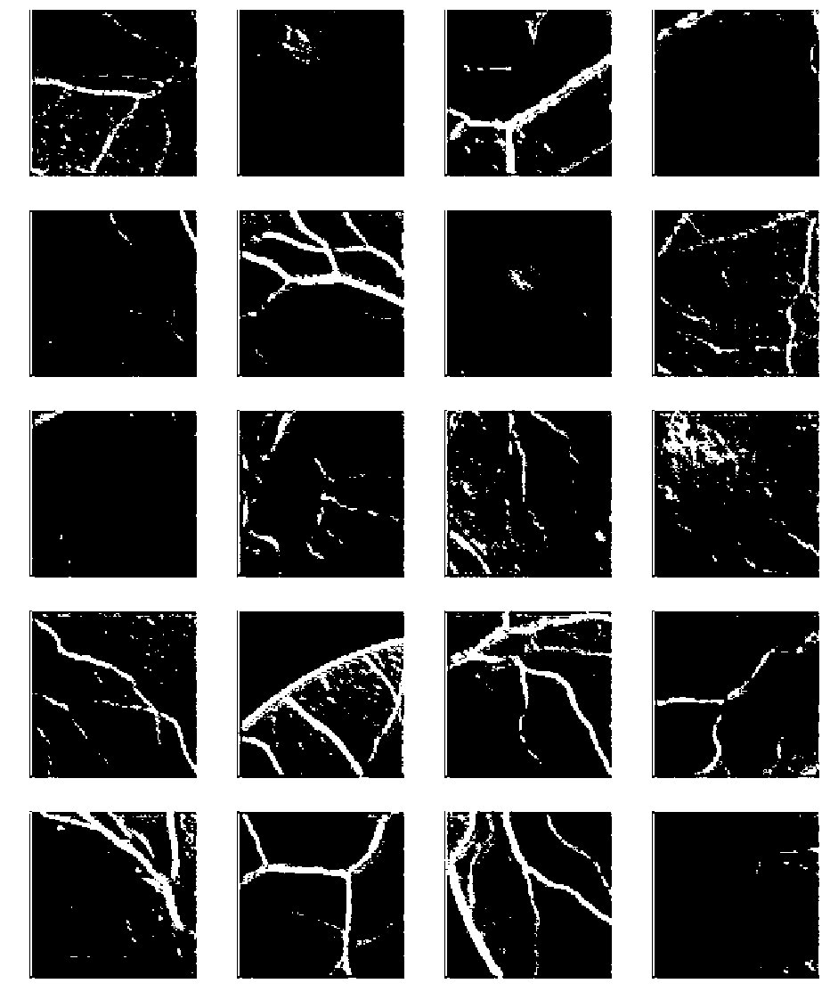

In [35]:
plot_preds_d(pred_4v1, 0.85)

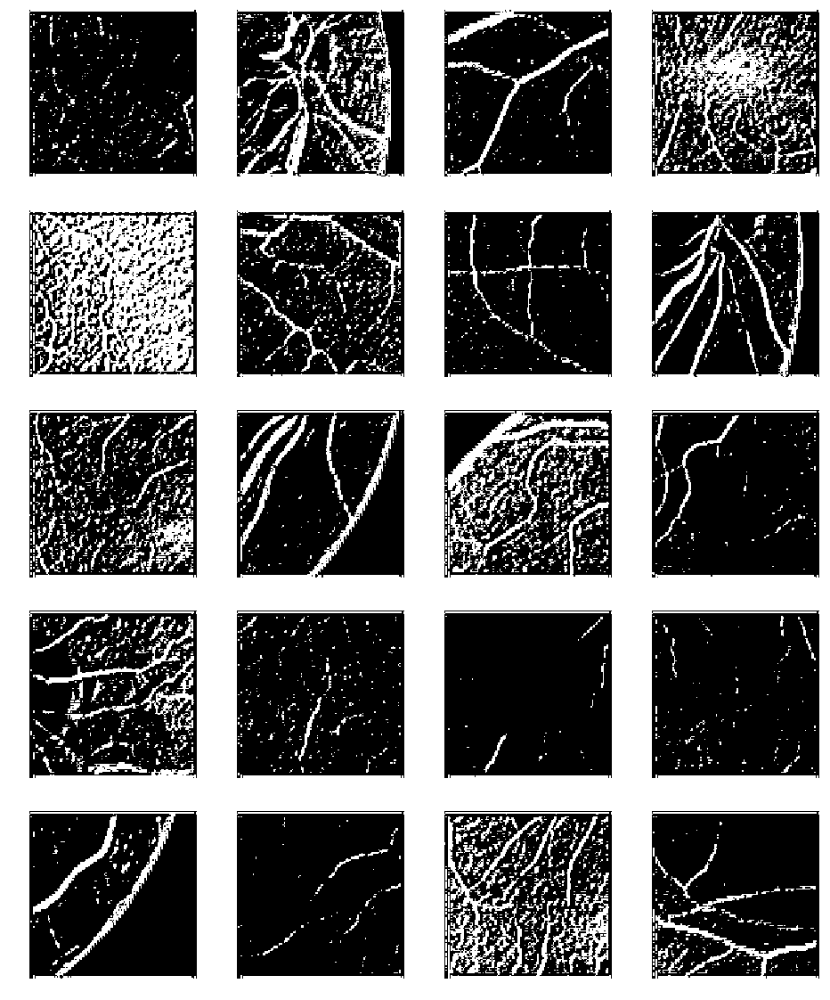

In [55]:
plot_preds_d(pred_4v1, 0.7)

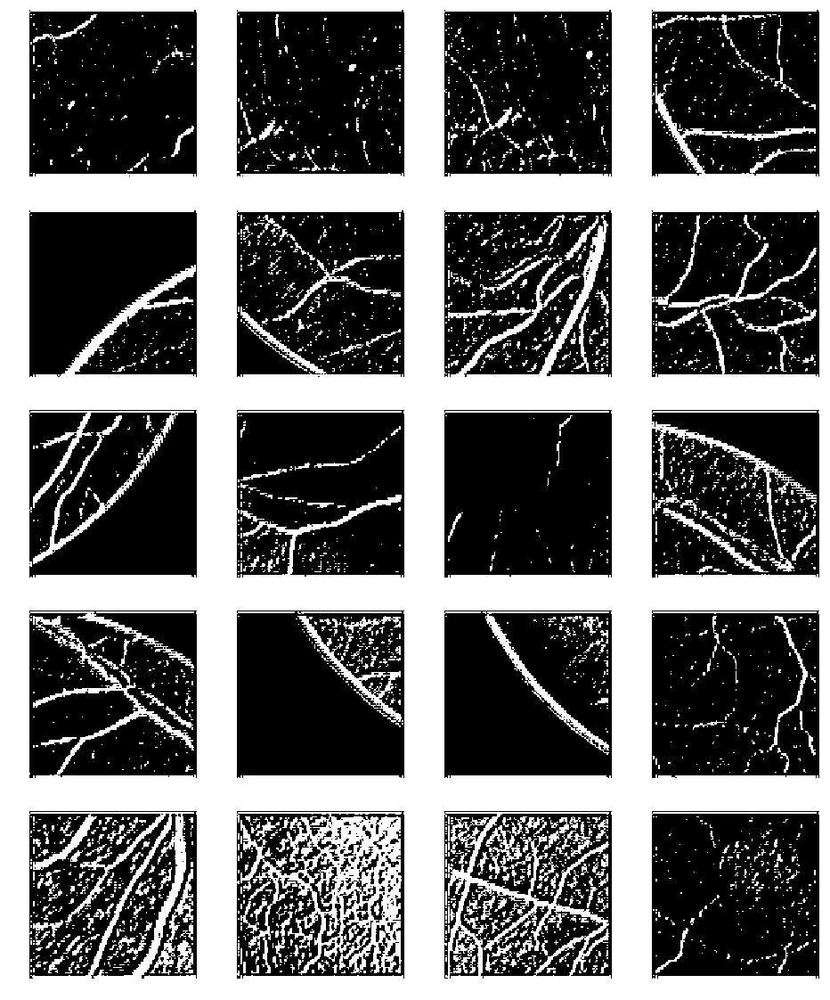

In [52]:
plot_preds_d(pred_4v1, 0.7)

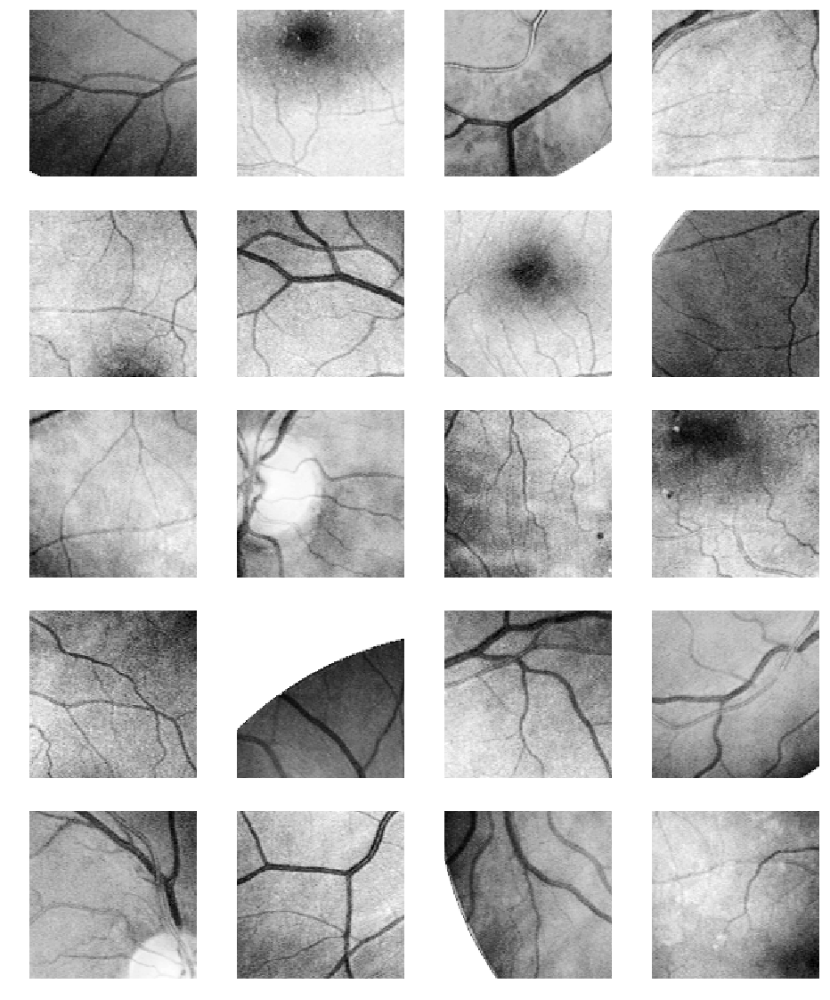

In [36]:
plot_preds_c(x_test)

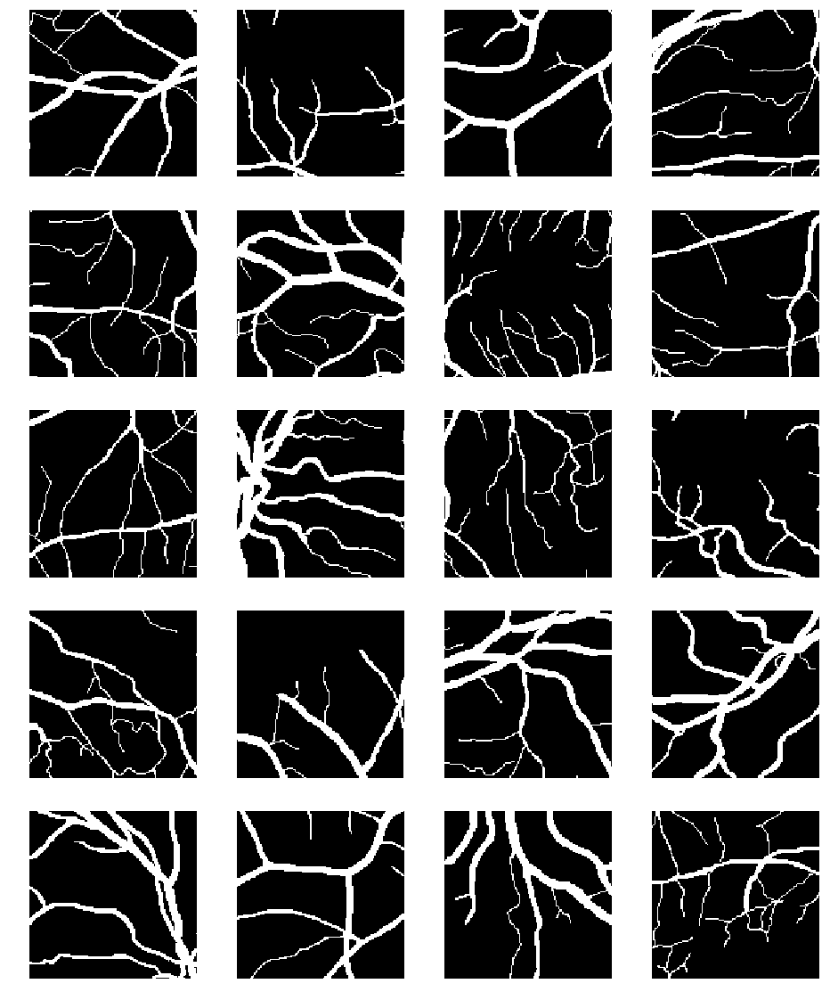

In [23]:
plot_preds_c(y_test)

In [26]:
w,h = 128,128

def get_unet(inputs, lossind):
    inputs = Input((w, h, 1))
    conv1 = Conv2D(32, (3, 3), activation='relu', padding='same')(inputs)
    conv1 = Conv2D(32, (3, 3), activation='relu', padding='same')(conv1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = Conv2D(64, (3, 3), activation='relu', padding='same')(pool1)
    conv2 = Conv2D(64, (3, 3), activation='relu', padding='same')(conv2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)

    conv3 = Conv2D(128, (3, 3), activation='relu', padding='same')(pool2)
    conv3 = Conv2D(128, (3, 3), activation='relu', padding='same')(conv3)
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)

    conv4 = Conv2D(256, (3, 3), activation='relu', padding='same')(pool3)
    conv4 = Conv2D(256, (3, 3), activation='relu', padding='same')(conv4)
    pool4 = MaxPooling2D(pool_size=(2, 2))(conv4)

    conv5 = Conv2D(512, (3, 3), activation='relu', padding='same')(pool4)
    conv5 = Conv2D(512, (3, 3), activation='relu', padding='same')(conv5)

    #up6 = concatenate([Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(conv5), conv4], axis=3)
    up6 = concatenate([UpSampling2D(size=(2, 2))(conv5), conv4], axis=3)
    conv6 = Conv2D(256, (3, 3), activation='relu', padding='same')(up6)
    conv6 = Conv2D(256, (3, 3), activation='relu', padding='same')(conv6)

    #up7 = concatenate([Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(conv6), conv3], axis=3)
    up7 = concatenate([UpSampling2D(size=(2, 2))(conv6), conv3], axis=3)
    conv7 = Conv2D(128, (3, 3), activation='relu', padding='same')(up7)
    conv7 = Conv2D(128, (3, 3), activation='relu', padding='same')(conv7)

    #up8 = concatenate([Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(conv7), conv2], axis=3)
    up8 = concatenate([UpSampling2D(size=(2, 2))(conv7), conv2], axis=3)
    conv8 = Conv2D(64, (3, 3), activation='relu', padding='same')(up8)
    conv8 = Conv2D(64, (3, 3), activation='relu', padding='same')(conv8)

    #up9 = concatenate([Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(conv8), conv1], axis=3)
    up9 = concatenate([UpSampling2D(size=(2, 2))(conv8), conv1], axis=3)
    conv9 = Conv2D(32, (3, 3), activation='relu', padding='same')(up9)
    conv9 = Conv2D(32, (3, 3), activation='relu', padding='same')(conv9)

    conv10 = Conv2D(1, (1, 1), activation='sigmoid')(conv9)

    model = Model(inputs=[inputs], outputs=[conv10])

    #model.compile(optimizer=Adam(lr=1e-5), loss=dice_coef_loss, metrics=[dice_coef])
    model.compile(optimizer=Adam(lr=1e-5), loss=compiler_loss(lossind)[0], metrics=[compiler_loss(lossind)[1]])
    
    
    return model

In [99]:
def get_unet_shorter(inputs, lossind):
    inputs = Input((w, h, 1))
#     conv1 = Conv2D(32, (3, 3), activation='relu', padding='same')(inputs)
#     conv1 = Conv2D(32, (3, 3), activation='relu', padding='same')(conv1)
#     pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)

    #conv2 = Conv2D(64, (3, 3), activation='relu', padding='same')(pool1)
    conv2 = Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
    conv2 = Conv2D(64, (3, 3), activation='relu', padding='same')(conv2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)

    conv3 = Conv2D(128, (3, 3), activation='relu', padding='same')(pool2)
    conv3 = Conv2D(128, (3, 3), activation='relu', padding='same')(conv3)
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)

    conv4 = Conv2D(256, (3, 3), activation='relu', padding='same')(pool3)
    conv4 = Conv2D(256, (3, 3), activation='relu', padding='same')(conv4)
    pool4 = MaxPooling2D(pool_size=(2, 2))(conv4)

    conv5 = Conv2D(512, (3, 3), activation='relu', padding='same')(pool4)
    conv5 = Conv2D(512, (3, 3), activation='relu', padding='same')(conv5)

    #up6 = concatenate([Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(conv5), conv4], axis=3)
    up6 = concatenate([UpSampling2D(size=(2, 2))(conv5), conv4], axis=3)
    conv6 = Conv2D(256, (3, 3), activation='relu', padding='same')(up6)
    conv6 = Conv2D(256, (3, 3), activation='relu', padding='same')(conv6)

    #up7 = concatenate([Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(conv6), conv3], axis=3)
    up7 = concatenate([UpSampling2D(size=(2, 2))(conv6), conv3], axis=3)
    conv7 = Conv2D(128, (3, 3), activation='relu', padding='same')(up7)
    conv7 = Conv2D(128, (3, 3), activation='relu', padding='same')(conv7)

    #up8 = concatenate([Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(conv7), conv2], axis=3)
    up8 = concatenate([UpSampling2D(size=(2, 2))(conv7), conv2], axis=3)
    conv8 = Conv2D(64, (3, 3), activation='relu', padding='same')(up8)
    conv8 = Conv2D(64, (3, 3), activation='relu', padding='same')(conv8)

    #up9 = concatenate([Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(conv8), conv1], axis=3)
#     up9 = concatenate([UpSampling2D(size=(2, 2))(conv8), conv1], axis=3)
#     conv9 = Conv2D(32, (3, 3), activation='relu', padding='same')(up9)
#     conv9 = Conv2D(32, (3, 3), activation='relu', padding='same')(conv9)

#     conv10 = Conv2D(1, (1, 1), activation='sigmoid')(conv9)
    conv10 = Conv2D(1, (1, 1), activation='sigmoid')(conv8)

    model = Model(inputs=[inputs], outputs=[conv10])

    #model.compile(optimizer=Adam(lr=1e-5), loss=dice_coef_loss, metrics=[dice_coef])
    model.compile(optimizer=Adam(lr=1e-5), loss=compiler_loss(lossind)[0], metrics=[compiler_loss(lossind)[1]])
    
    
    return model

In [100]:
def get_unet_db(inputs, lossind):
    inputs = Input((w, h, 1))
    conv1 = Conv2D(32, (3, 3), activation='relu', padding='same')(inputs)
    conv1 = Conv2D(32, (3, 3), activation='relu', padding='same')(conv1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = Conv2D(64, (3, 3), activation='relu', padding='same')(pool1)
    conv2 = Conv2D(64, (3, 3), activation='relu', padding='same')(conv2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)
    
    conv3 = Conv2D(128, (3, 3), activation='relu', padding='same')(pool2)
    conv3 = Conv2D(128, (3, 3), activation='relu', padding='same')(conv3)
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)

    contr3 = concatenate([inputs, conv3], axis=3)
    contr2 = concatenate([conv1, conv2, conv3], axis=3)
    contr1 = concatenate([pool1, pool2, pool3], axis=3)
    
    conv4 = Conv2D(256, (3, 3), activation='relu', padding='same')(pool3)
    conv4 = Conv2D(256, (3, 3), activation='relu', padding='same')(conv4)
    pool4 = MaxPooling2D(pool_size=(2, 2))(conv4)

    conv5 = Conv2D(512, (3, 3), activation='relu', padding='same')(pool4)
    conv5 = Conv2D(512, (3, 3), activation='relu', padding='same')(conv5)

    #up6 = concatenate([Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(conv5), conv4], axis=3)
    up6 = concatenate([UpSampling2D(size=(2, 2))(conv5), conv4], axis=3)
    conv6 = Conv2D(256, (3, 3), activation='relu', padding='same')(up6)
    conv6 = Conv2D(256, (3, 3), activation='relu', padding='same')(conv6)

    #up7 = concatenate([Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(conv6), conv3], axis=3)
    up7 = concatenate([UpSampling2D(size=(2, 2))(conv6), conv3], axis=3)
    conv7 = Conv2D(128, (3, 3), activation='relu', padding='same')(up7)
    conv7 = Conv2D(128, (3, 3), activation='relu', padding='same')(conv7)

    #up8 = concatenate([Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(conv7), conv2], axis=3)
    up8 = concatenate([UpSampling2D(size=(2, 2))(conv7), conv2], axis=3)
    conv8 = Conv2D(64, (3, 3), activation='relu', padding='same')(up8)
    conv8 = Conv2D(64, (3, 3), activation='relu', padding='same')(conv8)

    #up9 = concatenate([Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(conv8), conv1], axis=3)
    up9 = concatenate([UpSampling2D(size=(2, 2))(conv8), conv1], axis=3)
    conv9 = Conv2D(32, (3, 3), activation='relu', padding='same')(up9)
    conv9 = Conv2D(32, (3, 3), activation='relu', padding='same')(conv9)

    conv10 = Conv2D(1, (1, 1), activation='sigmoid')(conv9)

    model = Model(inputs=[inputs], outputs=[conv10])

    #model.compile(optimizer=Adam(lr=1e-5), loss=dice_coef_loss, metrics=[dice_coef])
    model.compile(optimizer=Adam(lr=1e-5), loss=compiler_loss(lossind)[0], metrics=[compiler_loss(lossind)[1]])
    
    
    return model

In [101]:
def get_unet1v5_db(inputs, lossind):

    inputs = Input((w, h, 1))
    conv1 = Conv2D(32, (3, 3), activation='relu', padding='same')(inputs)
    pool1 = MaxPooling2D(pool_size=(2, 2), padding='same')(conv1)
    up1 = concatenate([UpSampling2D(size=(2, 2))(pool1), conv1], axis=-1)
    conv2 = Conv2D(32, (3, 3), activation='relu', padding='same')(up1)
    conv3 = Conv2D(32, (3, 3), activation='sigmoid', padding='same')(conv2)
    conv3 = BatchNormalization(axis=-1)(conv3)
    conv4 = Conv2D(1, (3, 3), activation='sigmoid', padding='same')(conv3)
    
    #contr3 = concatenate([inputs, conv3], axis=3)
    
    model = Model(inputs=[inputs], outputs=[conv4])

   # model.compile(optimizer=Adam(lr=1e-5), loss=dice_coef_loss, metrics=[dice_coef])
    model.compile(optimizer=Adam(lr=1e-5), loss=compiler_loss(lossind)[0], metrics=[compiler_loss(lossind)[1]])#/, sample_weight_mode="temporal")
    
    return model


In [60]:
x_train = x_train_large
y_train = y_train_large

# x_train = x_train_small
# y_train = y_train_small

In [63]:
class_weights = [0.6, 0.4]
loss_type = 'weighted'
model_7v7, history_7v7 = train_model('7v7', get_unet, 8, 15, loss_type)

Train on 176 samples, validate on 44 samples
Epoch 1/15
176/176 [==============================] - 102s - loss: 25285506.0909 - weighted_crossentropy_coeff: -25285506.0909 - val_loss: 17175409.7273 - val_weighted_crossentropy_coeff: -17175409.7273
Epoch 2/15
176/176 [==============================] - 106s - loss: 7829333.6903 - weighted_crossentropy_coeff: -7829333.6903 - val_loss: 542645.9091 - val_weighted_crossentropy_coeff: -542645.9091
Epoch 3/15
176/176 [==============================] - 104s - loss: 231168.3963 - weighted_crossentropy_coeff: -231168.3963 - val_loss: 50760.8622 - val_weighted_crossentropy_coeff: -50760.8622
Epoch 4/15
176/176 [==============================] - 126s - loss: 35964.1782 - weighted_crossentropy_coeff: -35964.1782 - val_loss: 15783.4145 - val_weighted_crossentropy_coeff: -15783.4145
Epoch 5/15
176/176 [==============================] - 97s - loss: 13422.5533 - weighted_crossentropy_coeff: -13422.5533 - val_loss: 7896.2282 - val_weighted_crossentropy_c

MemoryError: 
Apply node that caused the error: Join(TensorConstant{3}, Reshape{4}.0, Elemwise{Composite{(i0 * (i1 + Abs(i1)))}}.0)
Toposort index: 301
Inputs types: [TensorType(int8, scalar), TensorType(float32, 4D), TensorType(float32, 4D)]
Inputs shapes: [(), (8L, 128L, 128L, 64L), (8L, 128L, 128L, 32L)]
Inputs strides: [(), (4194304L, 32768L, 256L, 4L), (2097152L, 16384L, 128L, 4L)]
Inputs values: [array(3, dtype=int8), 'not shown', 'not shown']
Outputs clients: [[InplaceDimShuffle{0,3,1,2}(Join.0)]]

Backtrace when the node is created(use Theano flag traceback.limit=N to make it longer):
  File "C:\Scisoft\Python\lib\site-packages\IPython\core\interactiveshell.py", line 2881, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-63-911afcb82729>", line 3, in <module>
    model_7v7, history_7v7 = train_model('7v7', get_unet, 8, 15, loss_type)
  File "<ipython-input-49-34ef693b66a2>", line 18, in train_model
    model = get_unet0(Input((w,h,1)), indcoef)
  File "<ipython-input-26-a92ff54a87ee>", line 40, in get_unet
    up9 = concatenate([UpSampling2D(size=(2, 2))(conv8), conv1], axis=3)
  File "C:\Scisoft\Python\lib\site-packages\keras\layers\merge.py", line 508, in concatenate
    return Concatenate(axis=axis, **kwargs)(inputs)
  File "C:\Scisoft\Python\lib\site-packages\keras\engine\topology.py", line 596, in __call__
    output = self.call(inputs, **kwargs)
  File "C:\Scisoft\Python\lib\site-packages\keras\layers\merge.py", line 283, in call
    return K.concatenate(inputs, axis=self.axis)
  File "C:\Scisoft\Python\lib\site-packages\keras\backend\theano_backend.py", line 807, in concatenate
    return T.concatenate([to_dense(x) for x in tensors], axis=axis)

HINT: Use the Theano flag 'exception_verbosity=high' for a debugprint and storage map footprint of this apply node.

In [ ]:
pred_7v7 = predict(model_7v7, x_test)
plot_preds_c(pred_7v7)

In [58]:
class_weights = [0.6, 0.4]
loss_type = 'weighted'
model_7v6, history_7v6 = train_model('7v6', get_unet, 8, 4, loss_type)

Train on 16 samples, validate on 4 samples
Epoch 1/4
16/16 [==============================] - 9s - loss: 4923736.0000 - weighted_crossentropy_coeff: -4923736.0000 - val_loss: 2178713.2500 - val_weighted_crossentropy_coeff: -2178713.2500
Epoch 2/4
16/16 [==============================] - 9s - loss: 3230560.8750 - weighted_crossentropy_coeff: -3230560.8750 - val_loss: 1315400.2500 - val_weighted_crossentropy_coeff: -1315400.2500
Epoch 3/4
16/16 [==============================] - 8s - loss: 1927065.4375 - weighted_crossentropy_coeff: -1927065.4375 - val_loss: 755838.5625 - val_weighted_crossentropy_coeff: -755838.5625
Epoch 4/4
16/16 [==============================] - 9s - loss: 1104152.3750 - weighted_crossentropy_coeff: -1104152.3750 - val_loss: 449607.1250 - val_weighted_crossentropy_coeff: -449607.1250


20/20 [==============================] - 3s


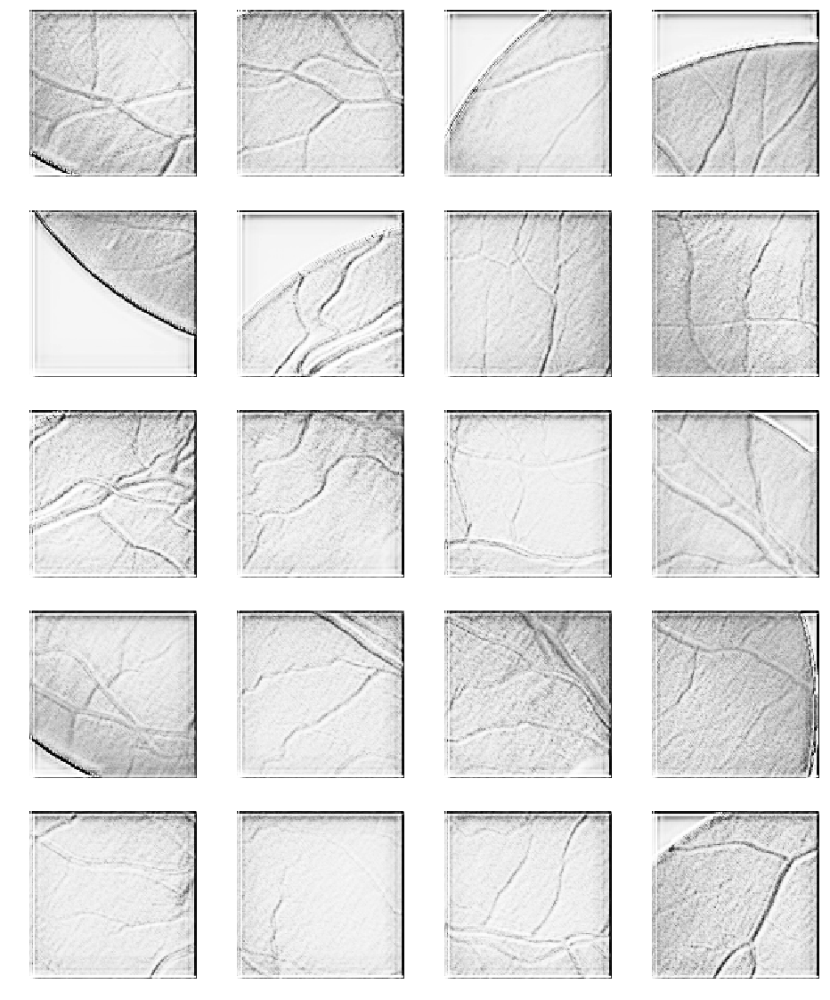

In [59]:
pred_7v6 = predict(model_7v6, x_test)
plot_preds_c(pred_7v6)

In [62]:
model_7v6.save('models/ves_7v6.h5')
model_7v6.save_weights('models/ves_7v6.h5')

In [52]:
class_weights = [0.6, 0.39]
loss_type = 'weighted'
model_7v6, history_7v6 = train_model('7v6', get_unet, 8, 4, loss_type)

Train on 16 samples, validate on 4 samples
Epoch 1/4
16/16 [==============================] - 9s - loss: 101744.1875 - weighted_crossentropy_coeff: -101744.1875 - val_loss: 47049.3242 - val_weighted_crossentropy_coeff: -47049.3242
Epoch 2/4
16/16 [==============================] - 9s - loss: 73284.5195 - weighted_crossentropy_coeff: -73284.5195 - val_loss: 33001.8164 - val_weighted_crossentropy_coeff: -33001.8164
Epoch 3/4
16/16 [==============================] - 9s - loss: 53960.4531 - weighted_crossentropy_coeff: -53960.4531 - val_loss: 22972.9336 - val_weighted_crossentropy_coeff: -22972.9336
Epoch 4/4
16/16 [==============================] - 9s - loss: 39646.9336 - weighted_crossentropy_coeff: -39646.9336 - val_loss: 16186.9473 - val_weighted_crossentropy_coeff: -16186.9473


20/20 [==============================] - 3s


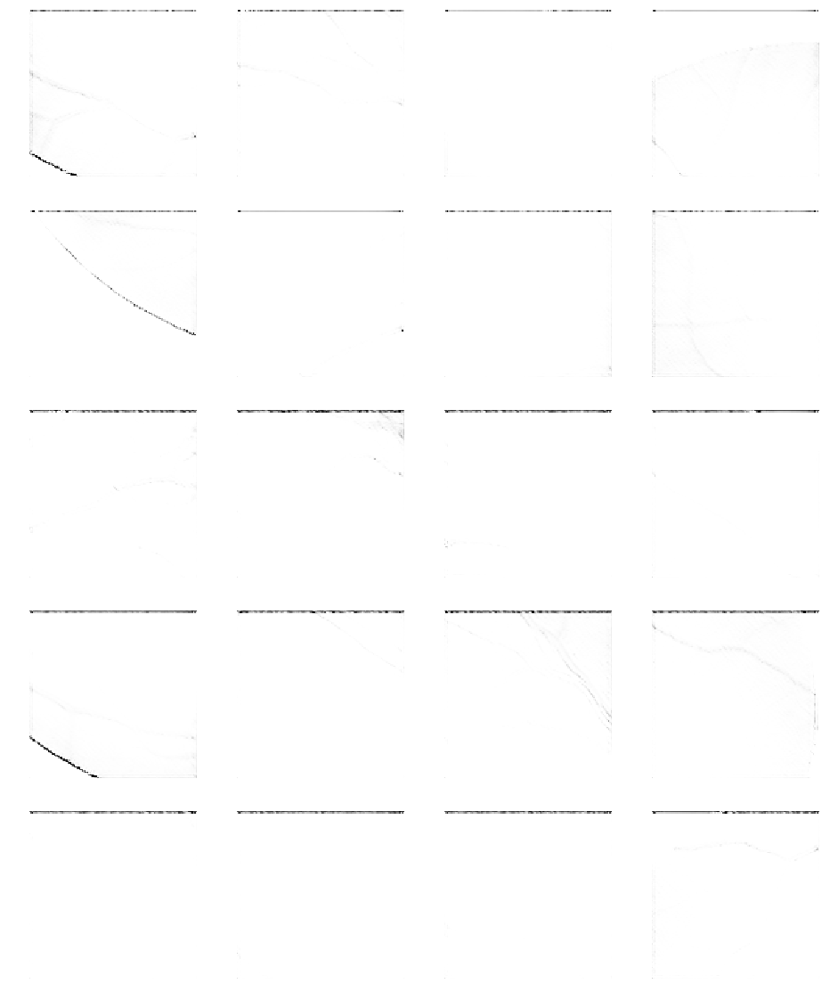

In [53]:
pred_7v6 = predict(model_7v6, x_test)
plot_preds_c(pred_7v6)

In [35]:
class_weights = [0.6, 0.4]
loss_type = 'weighted'
model_7v5, history_7v5 = train_model('7v5', get_unet, 8, 4, loss_type)

Train on 16 samples, validate on 4 samples
Epoch 1/4
16/16 [==============================] - 8s - loss: 17295387.5000 - weighted_crossentropy_coeff: -17295387.5000 - val_loss: 8674443.0000 - val_weighted_crossentropy_coeff: -8674443.0000
Epoch 2/4
16/16 [==============================] - 8s - loss: 15235624.0000 - weighted_crossentropy_coeff: -15235624.0000 - val_loss: 7578123.5000 - val_weighted_crossentropy_coeff: -7578123.5000
Epoch 3/4
16/16 [==============================] - 8s - loss: 13414336.5000 - weighted_crossentropy_coeff: -13414336.5000 - val_loss: 6531631.5000 - val_weighted_crossentropy_coeff: -6531631.5000
Epoch 4/4
16/16 [==============================] - 8s - loss: 11435646.0000 - weighted_crossentropy_coeff: -11435646.0000 - val_loss: 5542556.5000 - val_weighted_crossentropy_coeff: -5542556.5000


20/20 [==============================] - 2s


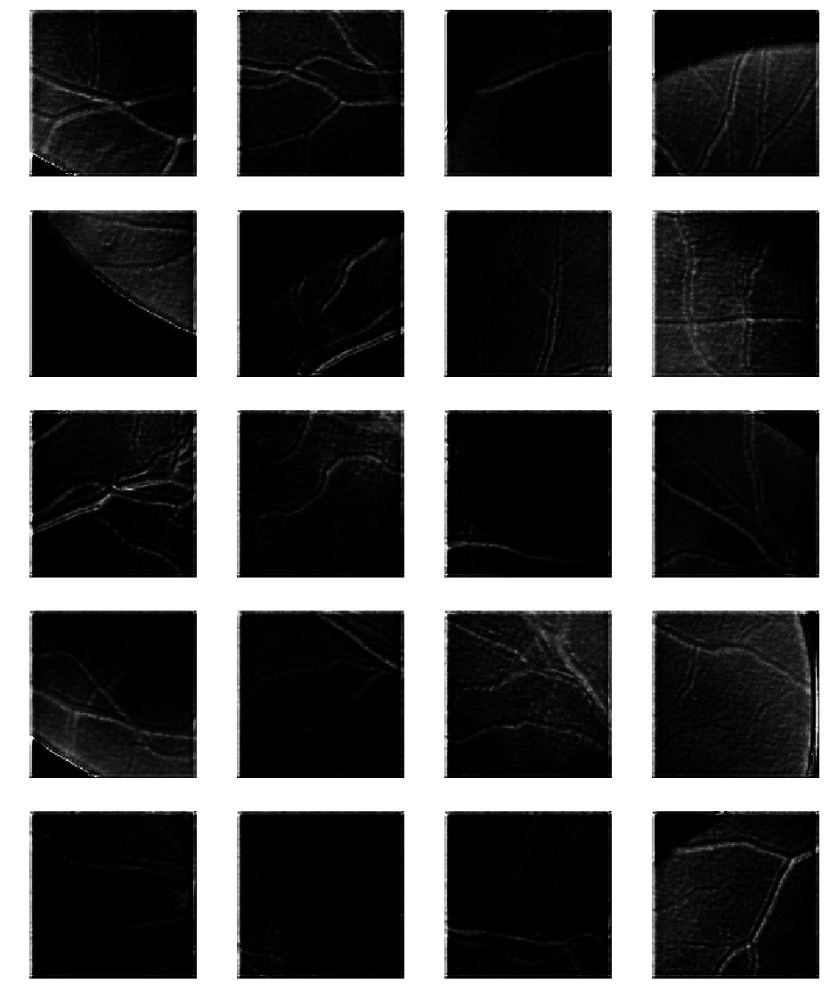

In [36]:
pred_7v5 = predict(model_7v5, x_test)
plot_preds_c(pred_7v5)

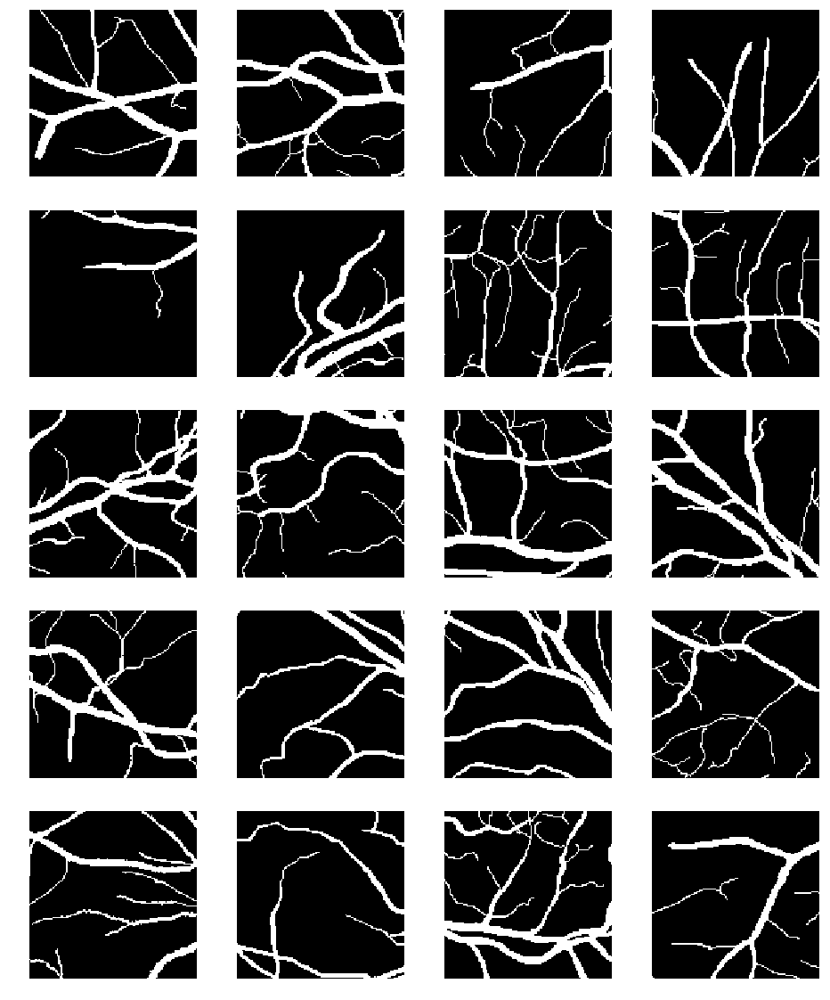

In [51]:
plot_preds_c(y_test)

In [50]:
model_7v5.save_weights('weights/ves_7v5.h5')
model_7v5.save('models/ves_7v5.h5')
save_data(pred_7v5, 'pred_7v5')

In [42]:
class_weights = [0.8, 0.2]
loss_type = 'weighted'
model_7v4, history_7v4 = train_model('7v4', get_unet, 8, 4, loss_type)

Train on 16 samples, validate on 4 samples
Epoch 1/4
16/16 [==============================] - 9s - loss: 1861823.6875 - weighted_crossentropy_coeff: -1861823.6875 - val_loss: 491034.7500 - val_weighted_crossentropy_coeff: -491034.7500
Epoch 2/4
16/16 [==============================] - 9s - loss: 1598831.8125 - weighted_crossentropy_coeff: -1598831.8125 - val_loss: 435222.2812 - val_weighted_crossentropy_coeff: -435222.2812
Epoch 3/4
16/16 [==============================] - 8s - loss: 1400087.3125 - weighted_crossentropy_coeff: -1400087.3125 - val_loss: 389142.0000 - val_weighted_crossentropy_coeff: -389142.0000
Epoch 4/4
16/16 [==============================] - 8s - loss: 1240334.4375 - weighted_crossentropy_coeff: -1240334.4375 - val_loss: 350050.2188 - val_weighted_crossentropy_coeff: -350050.2188


20/20 [==============================] - 3s


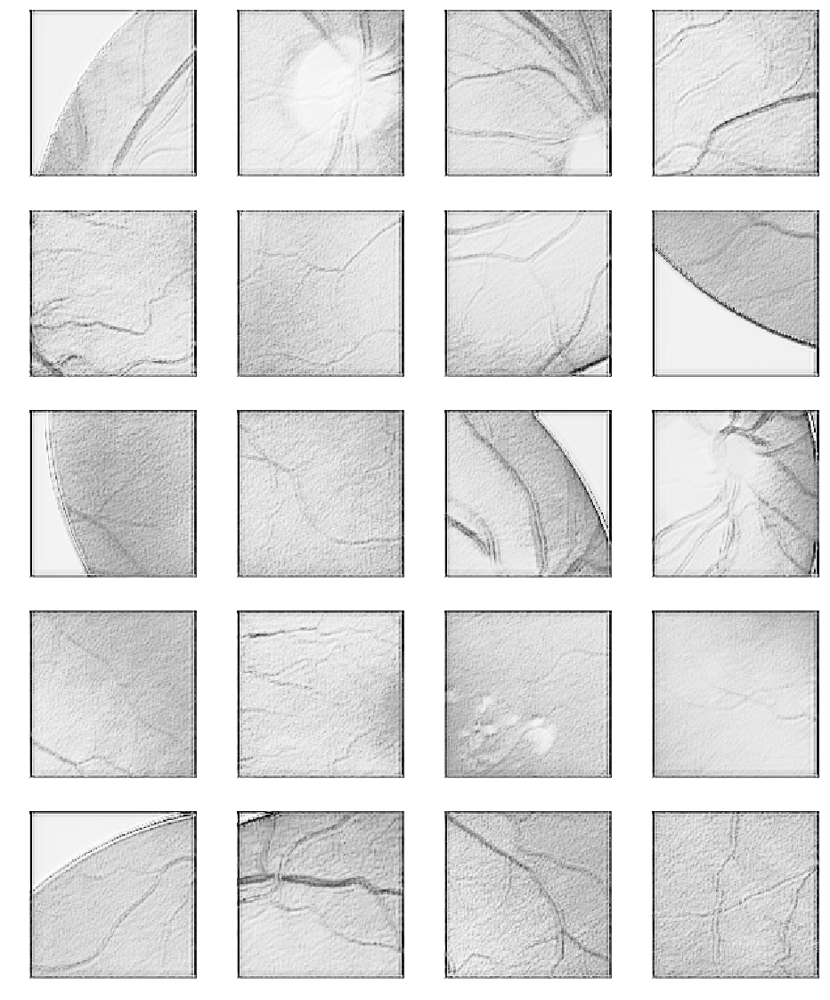

In [44]:
#plot_history(history_7v4, 'binary')
pred_7v4 = predict(model_7v4, x_test)
plot_preds_c(pred_7v4)

In [37]:
model_7v3, history_7v3 = train_model('7v3', get_unet, 8, 4, loss_type)

Train on 16 samples, validate on 4 samples
Epoch 1/4
16/16 [==============================] - 10s - loss: 156.5385 - acc: 0.8522 - val_loss: 75.7738 - val_acc: 0.9037
Epoch 2/4
16/16 [==============================] - 10s - loss: 144.4297 - acc: 0.8500 - val_loss: 69.4180 - val_acc: 0.9006
Epoch 3/4
16/16 [==============================] - 10s - loss: 131.8779 - acc: 0.8475 - val_loss: 63.1158 - val_acc: 0.8996
Epoch 4/4
16/16 [==============================] - 10s - loss: 118.8640 - acc: 0.8467 - val_loss: 56.9896 - val_acc: 0.8991


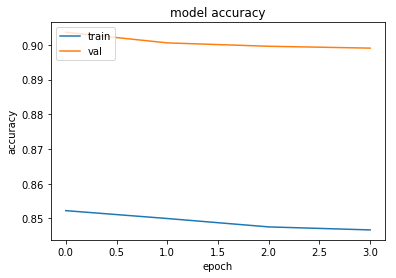

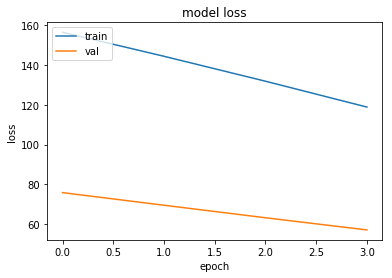

20/20 [==============================] - 3s


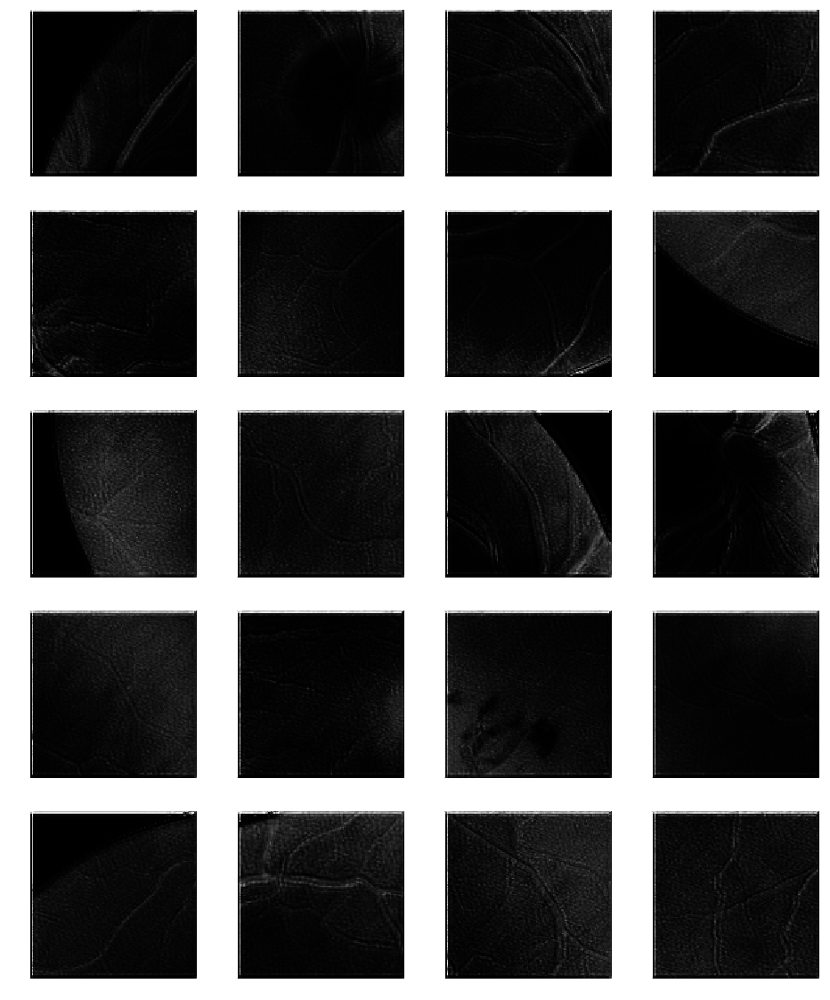

In [38]:
plot_history(history_7v3, 'binary')
pred_7v3 = predict(model_7v3, x_test)
plot_preds_c(pred_7v3)

In [31]:
loss_type = 'binary'
#model_7, history_7 = train_model('7', get_unet_db, 8, 15, loss_type)
model_7, history_7 = train_model('7', get_unet, 8, 15, loss_type)


Train on 16 samples, validate on 4 samples
Epoch 1/15
16/16 [==============================] - 9s - loss: 131.9479 - acc: 0.8732 - val_loss: 67.0870 - val_acc: 0.9259
Epoch 2/15
16/16 [==============================] - 8s - loss: 116.3587 - acc: 0.8730 - val_loss: 59.0142 - val_acc: 0.9256
Epoch 3/15
16/16 [==============================] - 8s - loss: 100.7056 - acc: 0.8727 - val_loss: 50.8674 - val_acc: 0.9242
Epoch 4/15
16/16 [==============================] - 8s - loss: 85.8791 - acc: 0.8720 - val_loss: 42.5338 - val_acc: 0.9198
Epoch 5/15
16/16 [==============================] - 8s - loss: 70.2561 - acc: 0.8683 - val_loss: 33.9425 - val_acc: 0.8996
Epoch 6/15
16/16 [==============================] - 9s - loss: 52.4798 - acc: 0.8553 - val_loss: 25.1499 - val_acc: 0.8286
Epoch 7/15
16/16 [==============================] - 9s - loss: 35.9838 - acc: 0.7993 - val_loss: 16.0534 - val_acc: 0.6457
Epoch 8/15
16/16 [==============================] - 9s - loss: 18.4117 - acc: 0.6109 - val_lo

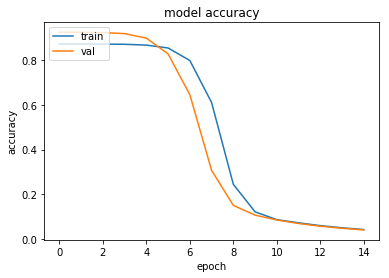

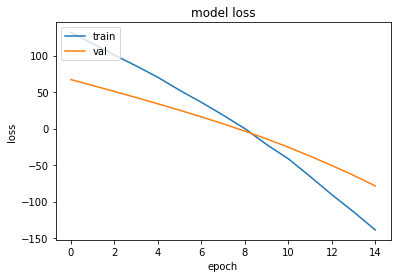

20/20 [==============================] - 3s


In [34]:
plot_history(history_7, 'binary')
pred_7 = predict(model_7, x_test)

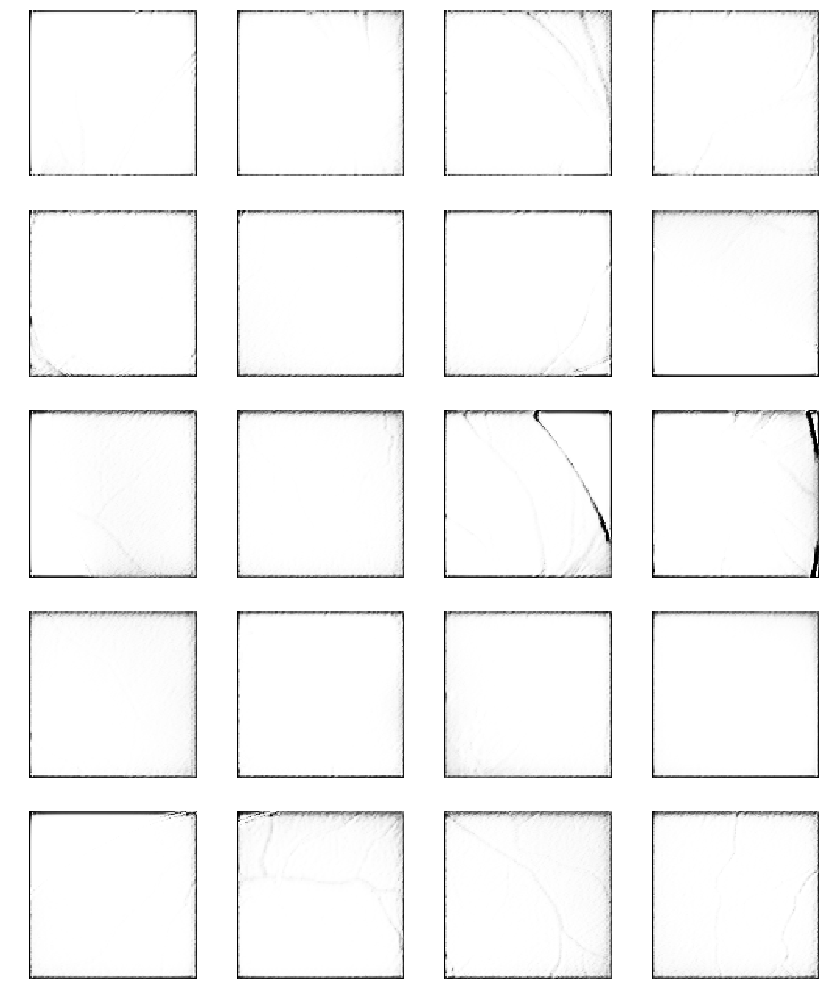

In [35]:
plot_preds_c(pred_7)

In [13]:
loss_type = 'binary'
#model_7, history_7 = train_model('7', get_unet_db, 8, 15, loss_type)
model_7, history_7 = train_model('7', get_unet, 8, 10, loss_type)


Train on 176 samples, validate on 44 samples
Epoch 1/10
176/176 [==============================] - 101s - loss: -303.1870 - acc: 0.0028 - val_loss: -347.0657 - val_acc: 2.4553e-04
Epoch 2/10
176/176 [==============================] - 103s - loss: -421.0997 - acc: 1.6334e-04 - val_loss: -394.2453 - val_acc: 8.8778e-05
Epoch 3/10
176/176 [==============================] - 114s - loss: -448.3990 - acc: 5.4446e-05 - val_loss: -402.3617 - val_acc: 1.6646e-05
Epoch 4/10
176/176 [==============================] - 129s - loss: -453.7712 - acc: 3.8147e-06 - val_loss: -405.6766 - val_acc: 2.7743e-06
Epoch 5/10
176/176 [==============================] - 93s - loss: -457.3530 - acc: 3.4679e-07 - val_loss: -408.7167 - val_acc: 0.0000e+00
Epoch 6/10
176/176 [==============================] - 149s - loss: -459.9242 - acc: 3.4679e-07 - val_loss: -409.7863 - val_acc: 0.0000e+00
Epoch 7/10
176/176 [==============================] - 94s - loss: -460.5186 - acc: 3.4679e-07 - val_loss: -410.0253 - val_acc:

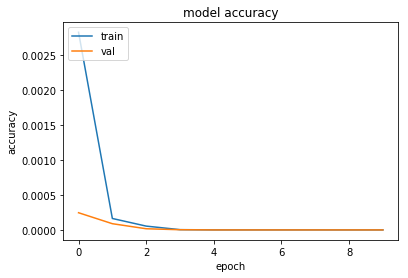

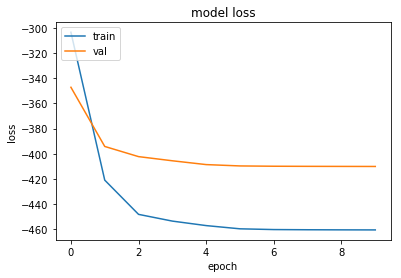

20/20 [==============================] - 3s


In [19]:
plot_history(history_7, 'binary')
pred_7 = predict(model_7, x_test)

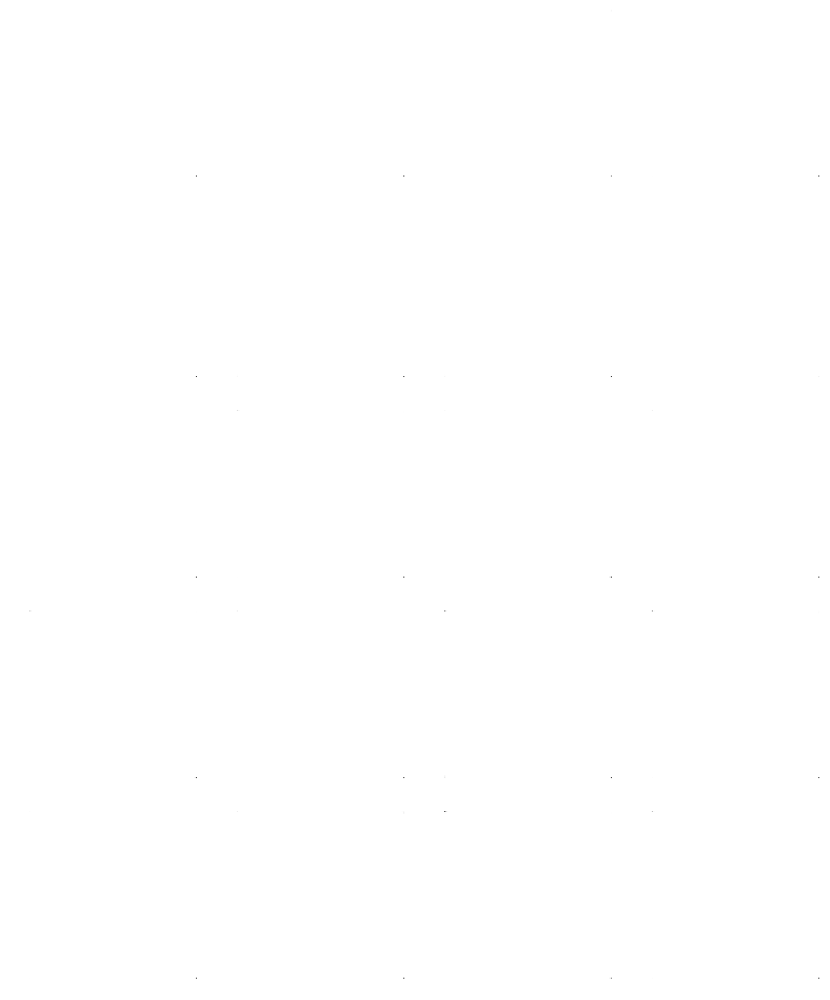

In [20]:
plot_preds_c(pred_7)

In [23]:
loss_type = 'dice'
model_3v2, history_3v2 = train_model('1', get_unet, 8, 15, loss_type)

ValueError: Unknown loss function:dice_coef

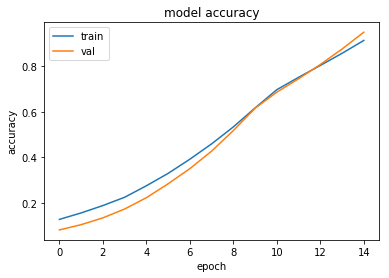

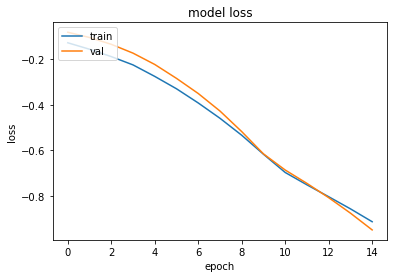

20/20 [==============================] - 3s


RuntimeError: Unable to create link (Name already exists)

In [75]:
plot_history(history_2, 'dice')
pred_2 = predict(model_2, x_test)
model_2.save('models/ves_2.h5')

(20L, 128L, 128L, 1L)
(128L, 128L, 1L)
(128L, 128L)
('threshold:', 0.65, 'usage:', 0)
('min and max predicted values:', 0.047217567, 0.80296355)


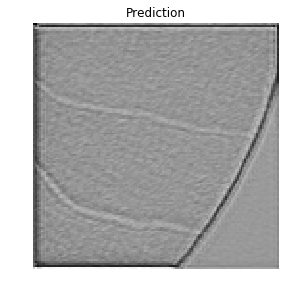

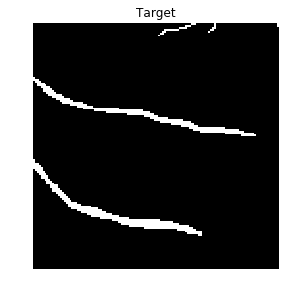

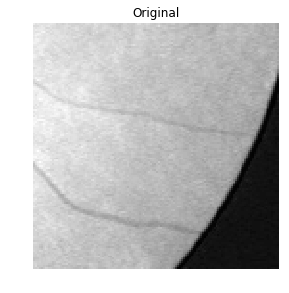

In [82]:
sample = 0
plot_preds(pred_2, x_test, y_test, sample, thresh, 0)

Train on 16 samples, validate on 4 samples
Epoch 1/30
16/16 [==============================] - 9s - loss: -1.8289 - dice_coef: 1.8289 - val_loss: -1.8704 - val_dice_coef: 1.8704
Epoch 2/30
16/16 [==============================] - 8s - loss: -1.8619 - dice_coef: 1.8619 - val_loss: -1.8825 - val_dice_coef: 1.8825
Epoch 3/30
16/16 [==============================] - 9s - loss: -1.8792 - dice_coef: 1.8792 - val_loss: -1.8893 - val_dice_coef: 1.8893
Epoch 4/30
16/16 [==============================] - 9s - loss: -1.8906 - dice_coef: 1.8906 - val_loss: -1.8936 - val_dice_coef: 1.8936
Epoch 5/30
16/16 [==============================] - 11s - loss: -1.8963 - dice_coef: 1.8963 - val_loss: -1.8968 - val_dice_coef: 1.8968
Epoch 6/30
16/16 [==============================] - 10s - loss: -1.9010 - dice_coef: 1.9010 - val_loss: -1.8993 - val_dice_coef: 1.8993
Epoch 7/30
16/16 [==============================] - 9s - loss: -1.9045 - dice_coef: 1.9045 - val_loss: -1.9012 - val_dice_coef: 1.9012
Epoch 8/30

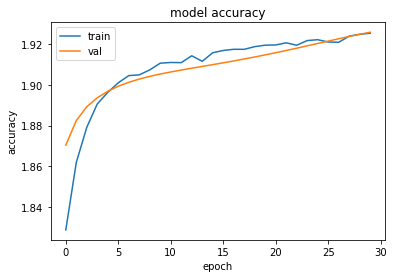

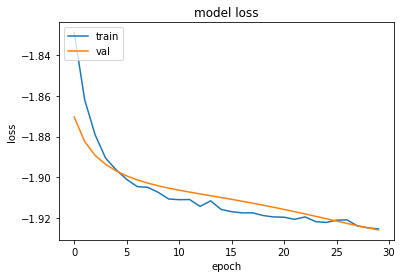

20/20 [==============================] - 3s


RuntimeError: Unable to create link (Name already exists)

In [83]:
loss_type = 'dice'
model_3, history_3 = train_model('1', get_unet, 8, 30, loss_type)

plot_history(history_3, 'dice')
pred_3 = predict(model_3, x_test)
model_3.save('models/ves_3.h5')


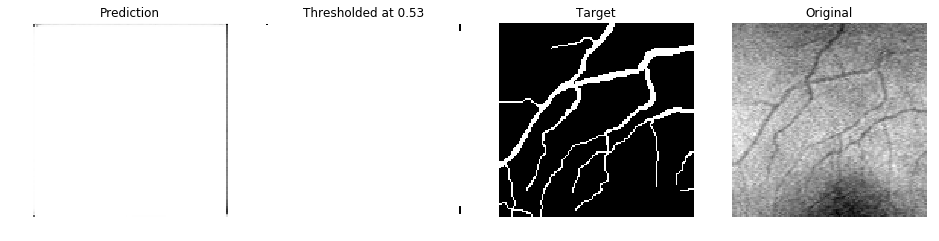

In [167]:
sample = 1
#plot_preds(pred_3, x_test, y_test, sample, thresh, 0)
plot_preds_b(pred_3, x_test, y_test, sample, 1, thresh)

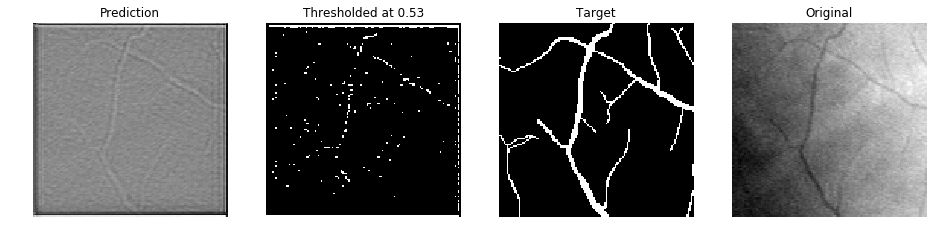

In [165]:
sample = 2
view = 1
thresh = 0.53
plot_preds_b(pred_2, x_test, y_test, sample, view, thresh)

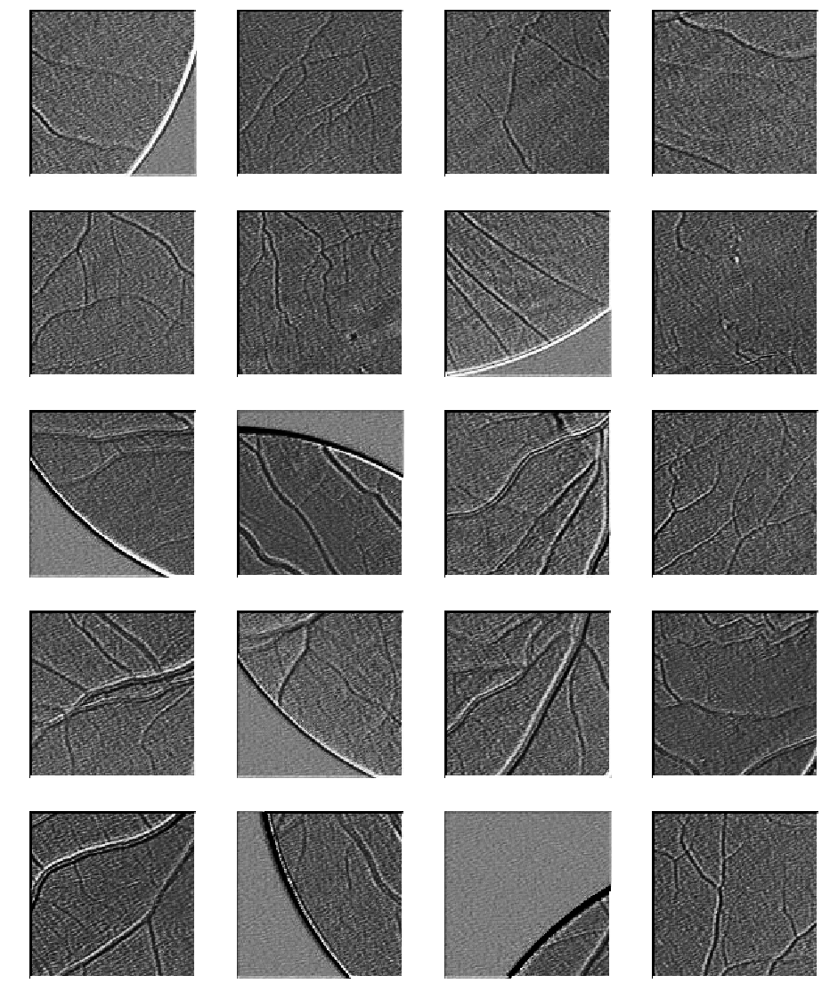

In [193]:
plot_preds_c(pred_1)

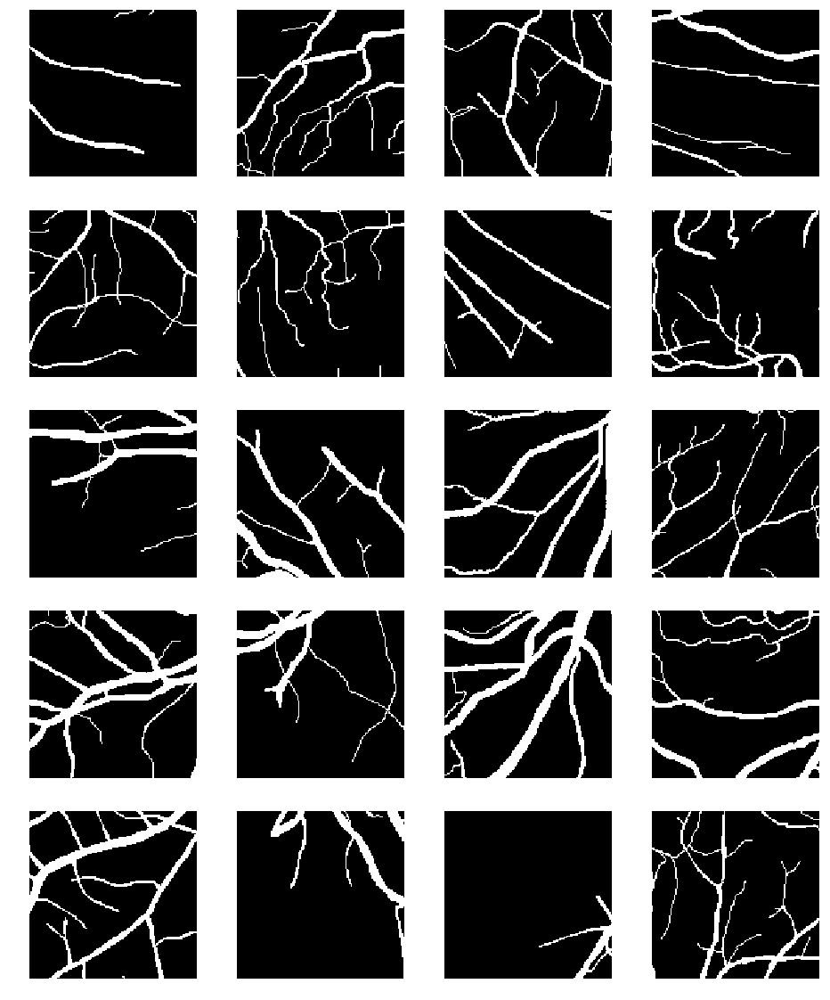

In [191]:
plot_preds_c(y_test)

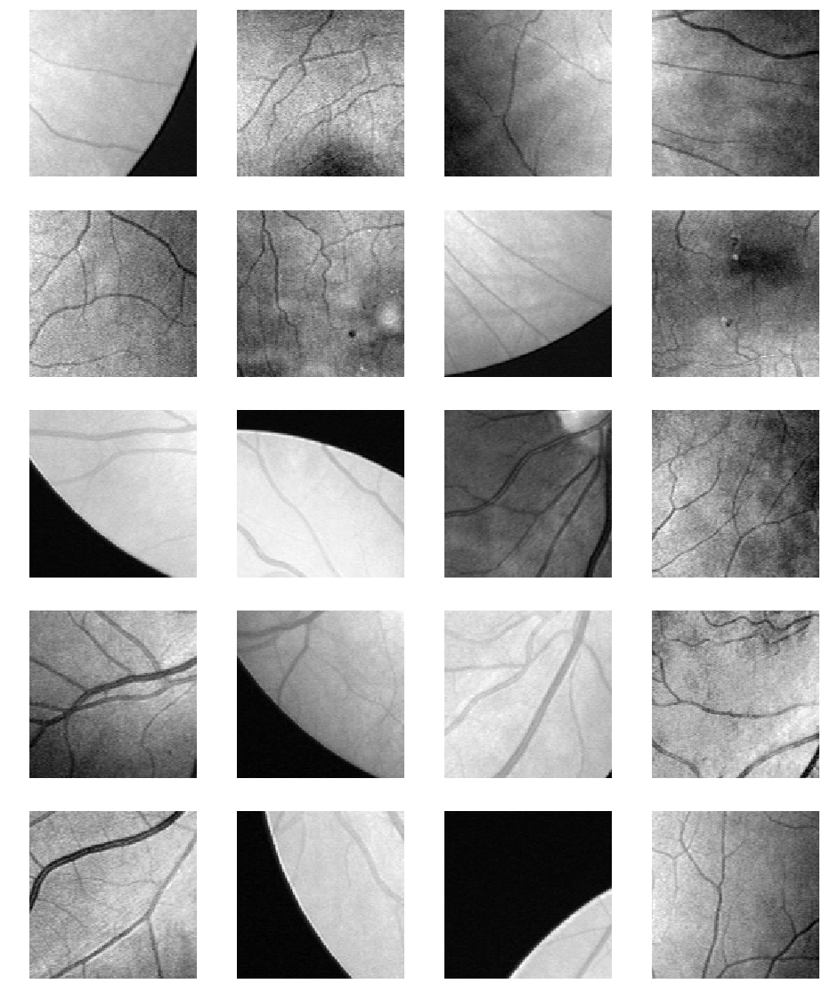

In [190]:
plot_preds_c(x_test) #from 20 set

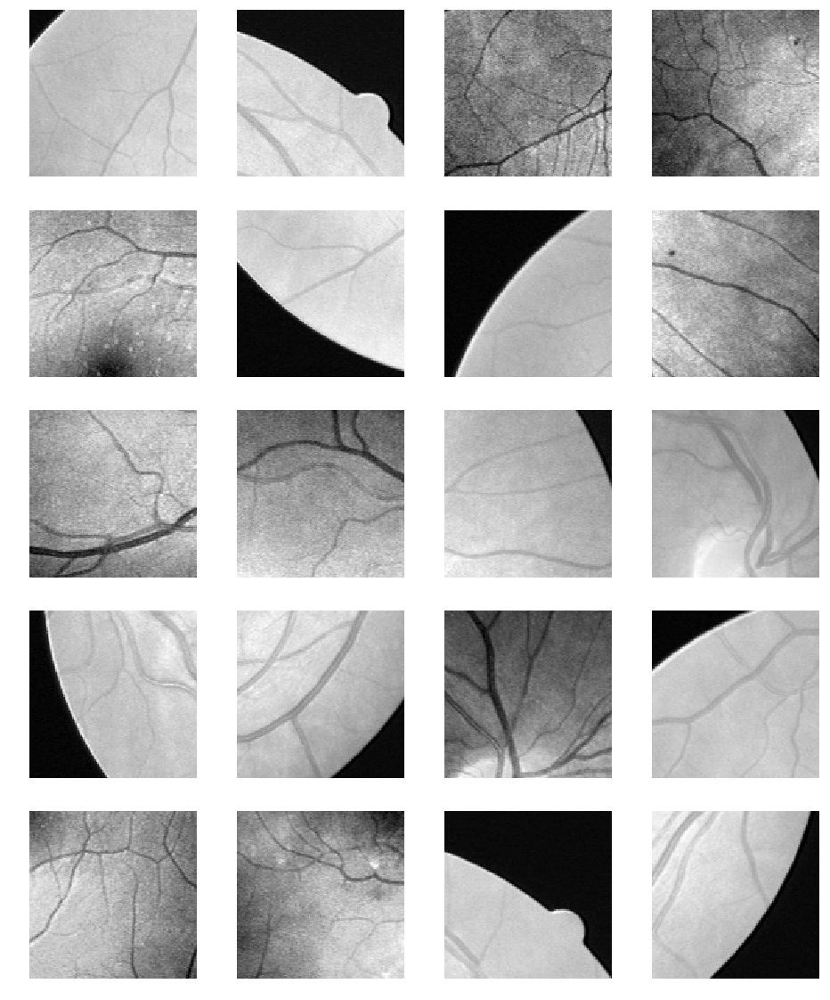

In [15]:
plot_preds_c(x_test) # from 220 set

In [196]:
loss_type = 'binary'
model_4, history_4 = train_model('4', get_unet, 8, 15, loss_type)

Train on 16 samples, validate on 4 samples
Epoch 1/15
16/16 [==============================] - 9s - loss: 293.3085 - acc: 0.8939 - val_loss: 359.7585 - val_acc: 0.8889
Epoch 2/15
16/16 [==============================] - 9s - loss: 275.4665 - acc: 0.8939 - val_loss: 337.4728 - val_acc: 0.8889
Epoch 3/15
16/16 [==============================] - 10s - loss: 256.9143 - acc: 0.8939 - val_loss: 314.6470 - val_acc: 0.8889
Epoch 4/15
16/16 [==============================] - 10s - loss: 238.7722 - acc: 0.8939 - val_loss: 291.5035 - val_acc: 0.8889
Epoch 5/15
16/16 [==============================] - 10s - loss: 221.3359 - acc: 0.8938 - val_loss: 268.9972 - val_acc: 0.8889
Epoch 6/15
16/16 [==============================] - 10s - loss: 203.8709 - acc: 0.8937 - val_loss: 247.0420 - val_acc: 0.8889
Epoch 7/15
16/16 [==============================] - 10s - loss: 186.4240 - acc: 0.8934 - val_loss: 225.0366 - val_acc: 0.8888
Epoch 8/15
16/16 [==============================] - 10s - loss: 170.0929 - ac

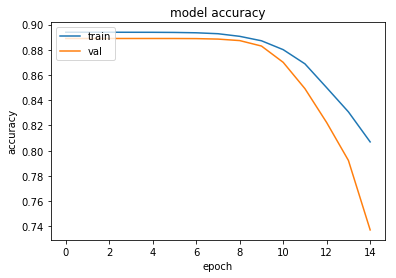

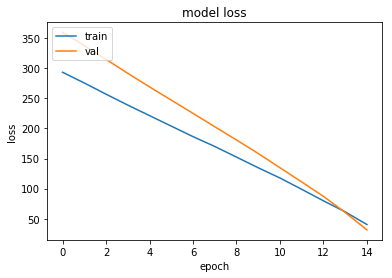

20/20 [==============================] - 3s


RuntimeError: Unable to create link (Name already exists)

In [197]:
plot_history(history_4, 'binary')
pred_4 = predict(model_4, x_test)
model_4.save('models/ves_4.h5')

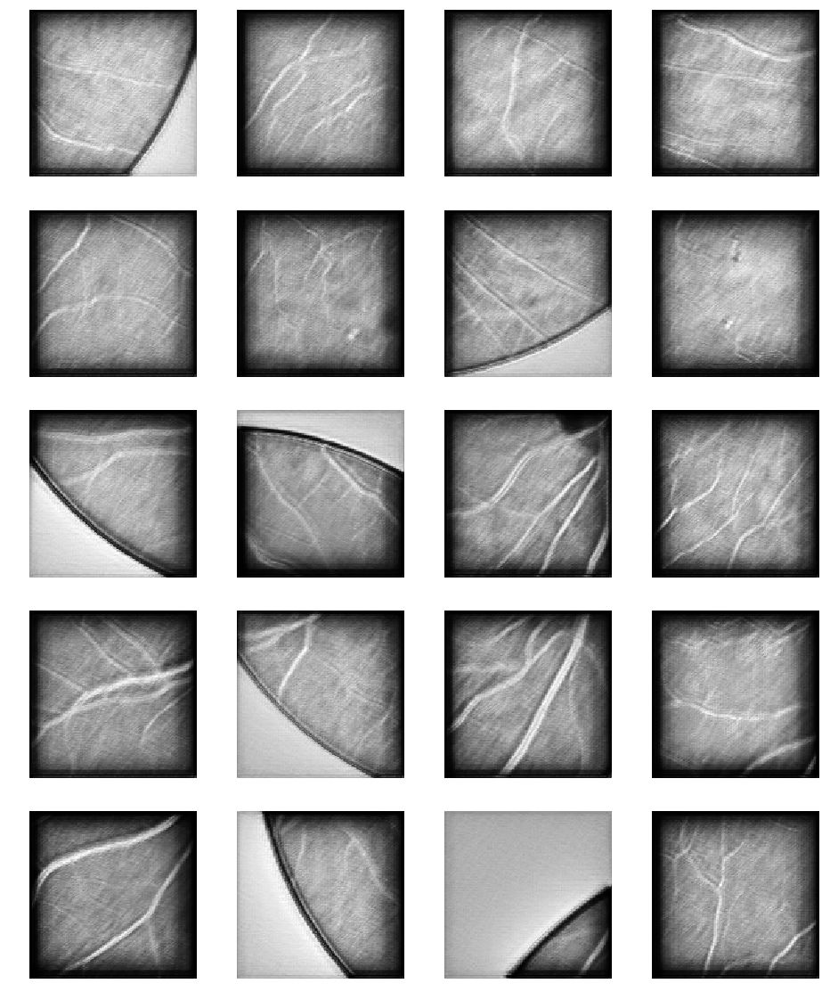

In [199]:
plot_preds_c(pred_4)

In [203]:
loss_type = 'binary'
model_5, history_5 = train_model('0', get_unet, 8, 30, loss_type)

Train on 16 samples, validate on 4 samples
Epoch 1/30
16/16 [==============================] - 9s - loss: -29.5935 - acc: 0.0789 - val_loss: -54.2798 - val_acc: 0.0573
Epoch 2/30
16/16 [==============================] - 9s - loss: -45.6685 - acc: 0.0530 - val_loss: -74.6319 - val_acc: 0.0433
Epoch 3/30
16/16 [==============================] - 9s - loss: -60.8967 - acc: 0.0393 - val_loss: -93.5428 - val_acc: 0.0367
Epoch 4/30
16/16 [==============================] - 9s - loss: -75.9162 - acc: 0.0338 - val_loss: -111.8037 - val_acc: 0.0346
Epoch 5/30
16/16 [==============================] - 9s - loss: -89.6969 - acc: 0.0316 - val_loss: -129.5701 - val_acc: 0.0335
Epoch 6/30
16/16 [==============================] - 9s - loss: -102.8449 - acc: 0.0302 - val_loss: -145.8883 - val_acc: 0.0327
Epoch 7/30
16/16 [==============================] - 9s - loss: -115.7516 - acc: 0.0293 - val_loss: -161.2571 - val_acc: 0.0321
Epoch 8/30
16/16 [==============================] - 10s - loss: -127.5783 - 

RuntimeError: CorrMM failed to allocate working memory of 1 x 864 x 16384

Apply node that caused the error: CorrMM{half, (1, 1), (1, 1)}(InplaceDimShuffle{0,3,1,2}.0, Subtensor{::, ::, ::int64, ::int64}.0)
Toposort index: 317
Inputs types: [TensorType(float32, 4D), TensorType(float32, 4D)]
Inputs shapes: [(8L, 96L, 128L, 128L), (32L, 96L, 3L, 3L)]
Inputs strides: [(6291456L, 4L, 49152L, 384L), (4L, 128L, -36864L, -12288L)]
Inputs values: ['not shown', 'not shown']
Outputs clients: [[InplaceDimShuffle{0,2,3,1}(CorrMM{half, (1, 1), (1, 1)}.0)]]

Backtrace when the node is created(use Theano flag traceback.limit=N to make it longer):
  File "C:\Scisoft\Python\lib\site-packages\IPython\core\interactiveshell.py", line 2821, in run_ast_nodes
    if self.run_code(code, result):
  File "C:\Scisoft\Python\lib\site-packages\IPython\core\interactiveshell.py", line 2881, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-203-167f8d7531a8>", line 2, in <module>
    model_5, history_5 = train_model('0', get_unet, 8, 30, loss_type)
  File "<ipython-input-81-8c7fd0e1a585>", line 18, in train_model
    model = get_unet0(Input((w,h,1)), indcoef)
  File "<ipython-input-195-b55cb67562be>", line 39, in get_unet
    conv9 = Conv2D(32, (3, 3), activation='relu', padding='same')(up9)
  File "C:\Scisoft\Python\lib\site-packages\keras\engine\topology.py", line 596, in __call__
    output = self.call(inputs, **kwargs)
  File "C:\Scisoft\Python\lib\site-packages\keras\layers\convolutional.py", line 164, in call
    dilation_rate=self.dilation_rate)
  File "C:\Scisoft\Python\lib\site-packages\keras\backend\theano_backend.py", line 1844, in conv2d
    filter_dilation=dilation_rate)

HINT: Use the Theano flag 'exception_verbosity=high' for a debugprint and storage map footprint of this apply node.

In [ ]:
plot_history(history_5, 'binary')
pred_5 = predict(model_5, x_test)
#model_5.save('models/ves_5.h5')

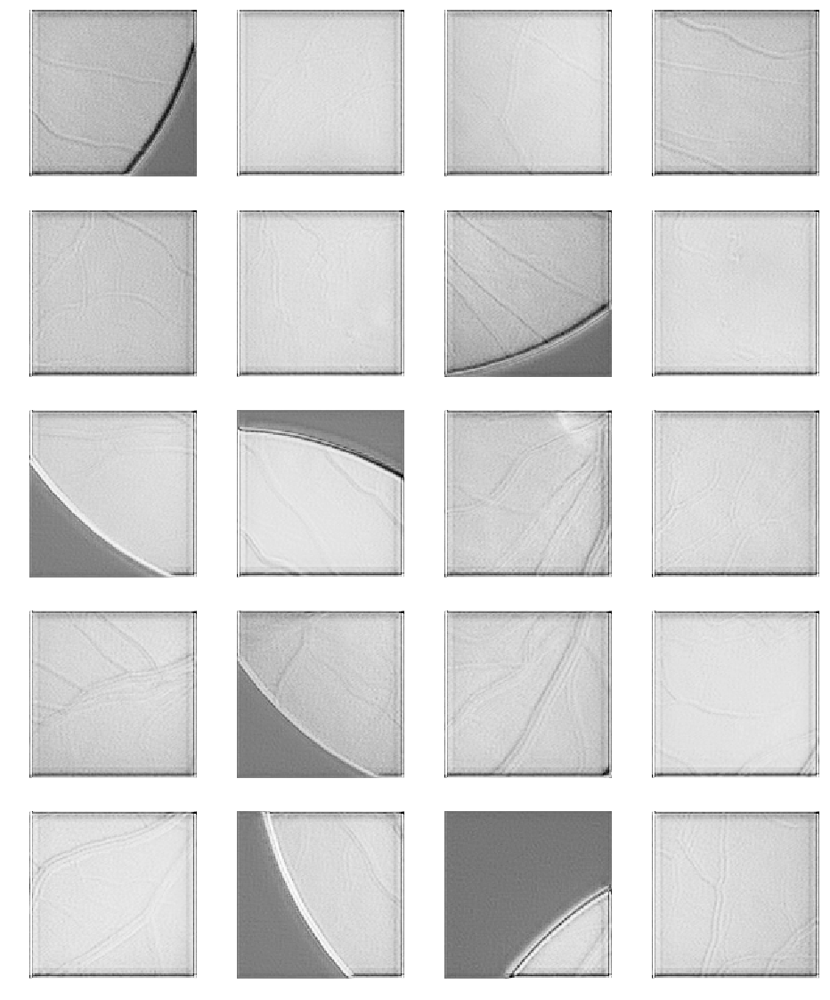

In [221]:
plot_preds_c(pred_5)

In [14]:
loss_type = 'binary'
model_6, history_6 = train_model('6', get_unet, 8, 12, loss_type)

Train on 176 samples, validate on 44 samples
Epoch 1/12
176/176 [==============================] - 92s - loss: 244.2803 - acc: 0.8841 - val_loss: 192.6152 - val_acc: 0.8708
Epoch 2/12
176/176 [==============================] - 92s - loss: 125.9732 - acc: 0.8732 - val_loss: 45.5287 - val_acc: 0.8283
Epoch 3/12
176/176 [==============================] - 98s - loss: -54.9328 - acc: 0.2638 - val_loss: -230.9189 - val_acc: 0.0241
Epoch 4/12
176/176 [==============================] - 99s - loss: -385.7175 - acc: 0.0188 - val_loss: -489.9158 - val_acc: 0.0144
Epoch 5/12
176/176 [==============================] - 119s - loss: -446.2623 - acc: 0.0032 - val_loss: -503.5104 - val_acc: 5.1325e-04
Epoch 6/12
176/176 [==============================] - 93s - loss: -452.6429 - acc: 4.0020e-04 - val_loss: -504.9082 - val_acc: 3.3708e-04
Epoch 7/12
176/176 [==============================] - 95s - loss: -453.1334 - acc: 2.9269e-04 - val_loss: -505.2032 - val_acc: 2.6911e-04
Epoch 8/12
176/176 [==========

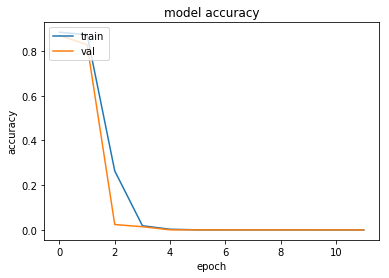

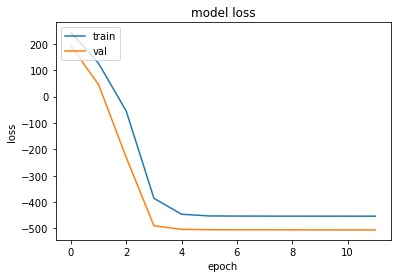

20/20 [==============================] - 2s


In [16]:
plot_history(history_6, 'binary')
pred_6 = predict(model_6, x_test)

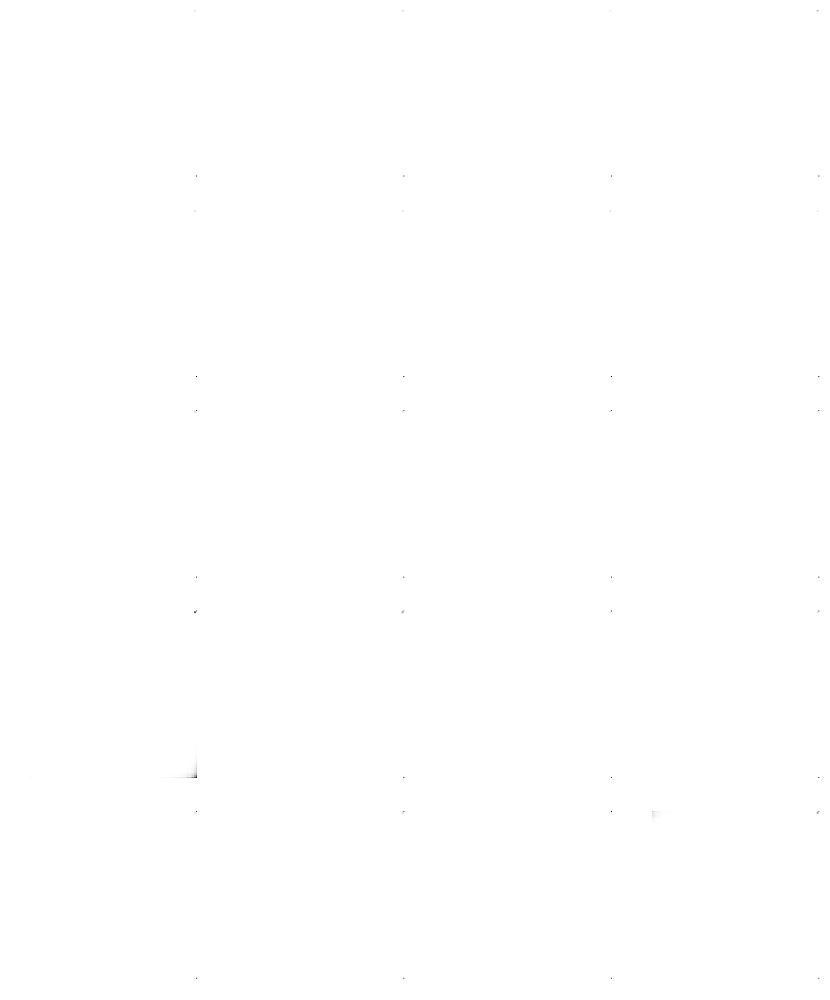

In [17]:
plot_preds_c(pred_6)

In [59]:
pool = 2
b28order = 'same'
activ = 'relu'
filter_size = 3
w,h = 128, 1
net_print = 0

def get_unet_2(inputs, lossind):
    #inputs = Input((w, h, 1))
    conv1 = Conv2D(32, (3, 3), activation='relu', padding=border, name='conv1-1')(inputs)
    conv1 = Conv2D(32, (3, 3), activation='relu', padding=border, name='conv1-2')(conv1)
    if net_print:
        print('conv1: ', conv1)
    pool1 = MaxPooling2D(pool_size=(pool, pool))(conv1)
    if net_print:
        print('pool1: ', pool1)


    conv2 = Conv2D(64, (3, 3), activation='relu', padding=border, name='conv2-1')(pool1)
    conv2 = Conv2D(64, (3, 3), activation='relu', padding=border, name='conv2-2')(conv2)
    if net_print:
        print('conv2: ', conv2)
    pool2 = MaxPooling2D(pool_size=(pool, pool))(conv2)
    if net_print:
        print('pool12: ', pool2)

    conv3 = Conv2D(128, (3, 3), activation='relu', padding=border, name='conv3-1')(pool2)
    conv3 = Conv2D(128, (3, 3), activation='relu', padding=border, name='conv3-2')(conv3)
    if net_print:
        print('conv3: ', conv3)
    pool3 = MaxPooling2D(pool_size=(pool, pool))(conv3)
    if net_print:
        print('pool3: ', pool3)

    conv4 = Conv2D(256, (3, 3), activation='relu', padding=border, name='conv4-1')(pool3)
    conv4 = Conv2D(256, (3, 3), activation='relu', padding=border, name='conv4-2')(conv4)
    if net_print:
        print('conv4: ', conv4)
    pool4 = MaxPooling2D(pool_size=(pool, pool))(conv4)
    if net_print:
        print('pool4: ', pool4)

    conv5 = Conv2D(512, (3, 3), activation='relu', padding=border, name='conv5-1')(pool4)
    conv5 = Conv2D(512, (3, 3), activation='relu', padding=border, name='conv5-2')(conv5)
    if net_print:
        print('conv5: ', conv5)

    up6 = concatenate([UpSampling2D(size=(pool, pool))(conv5), conv4], axis=-1)
    if net_print:
        print('up6: ', up6)
    conv6 = Conv2D(256, (3, 3), activation='relu', padding=border, name='conv6-1')(up6)
    conv6 = Conv2D(256, (3, 3), activation='relu', padding=border, name='conv6-2')(conv6)
    if net_print:
        print('conv6: ', conv6)

    up7 = concatenate([UpSampling2D(size=(pool, pool))(conv6), conv3], axis=-1)
    if net_print:
        print('up7: ', up7)
    conv7 = Conv2D(128, (3, 3), activation='relu', padding=border, name='conv7-1')(up7)
    conv7 = Conv2D(128, (3, 3), activation='relu', padding=border, name='conv7-2')(conv7)
    if net_print:
        print('conv7: ', conv7)

    up8 = concatenate([UpSampling2D(size=(pool, pool))(conv7), conv2], axis=-1)
    if net_print:
        print('up8: ', up8)
    conv8 = Conv2D(64, (3, 3), activation='relu', padding=border, name='conv8-1')(up8)
    conv8 = Conv2D(64, (3, 3), activation='relu', padding=border, name='conv8-2')(conv8)
    if net_print:
        print('conv8: ', conv8)

    up9 = concatenate([UpSampling2D(size=(pool, pool))(conv8), conv1], axis=-1)
    if net_print:
        print('up9: ', up9)
    conv9 = Conv2D(32, (3, 3), activation='relu', padding=border, name='conv9-1')(up9)
    conv9 = Conv2D(32, (3, 3), activation='relu', padding=border, name='conv9-2')(conv9)
    if net_print:
        print('conv9: ', conv9)
    conv10 = Conv2D(1, (1, 1), activation='sigmoid', padding=border, name='conv10')(conv9)
    if net_print:
        print('conv10: ', conv10)
        
    model = Model(inputs=inputs, outputs=conv10)

    #model.compile(optimizer=Adam(lr=1e-5), loss=weighted_crossentropy_loss, metrics=[weighted_crossentropy_coeff])#/, sample_weight_mode="temporal")
    model.compile(optimizer=Adam(lr=1e-5), loss=compiler_loss(lossind)[0], metrics=[compiler_loss(lossind)[1]])
    
    return model


In [66]:
loss_type = 'binary'
model_7, history_7 = train_model('7', get_unet, 8, 15, loss_type)


ValueError: `Concatenate` layer requires inputs with matching shapes except for the concat axis. Got inputs shapes: [(None, 128, 0, 128), (None, 128, 1, 64)]

# Saving

In [62]:
model_4v1.save('models/ves_4v1.h5')

In [61]:
model_4v1.save_weights('weights/ves_4v1.h5')

In [63]:
json_string = model_4v1.to_json()

In [40]:
def save_data(thing, thingname):

    savepath = 'data/'
    cPickle.dump(thing, open(savepath + thingname + '.npy', "wb" ))
    
#     thing.save(savepath + thingname + '.npy', CXY)
#     thing.savetxt(savepath + thingname + '.npy', CXY)
     #cPickle.dump(thing, open( "filename.pkl", "wb" ) ) 
#     pred_5.save('maximums.npy', CXY)
#     np.savetxt('maximums.txt', CXY)

def load_data(thingname):
    savepath = 'data/'
    ploaded = cPickle.load( open( savepath + thingname + '.npy', "rb" ) )
    return ploaded
    

In [89]:
save_data(y_test, 'y_test_o3')

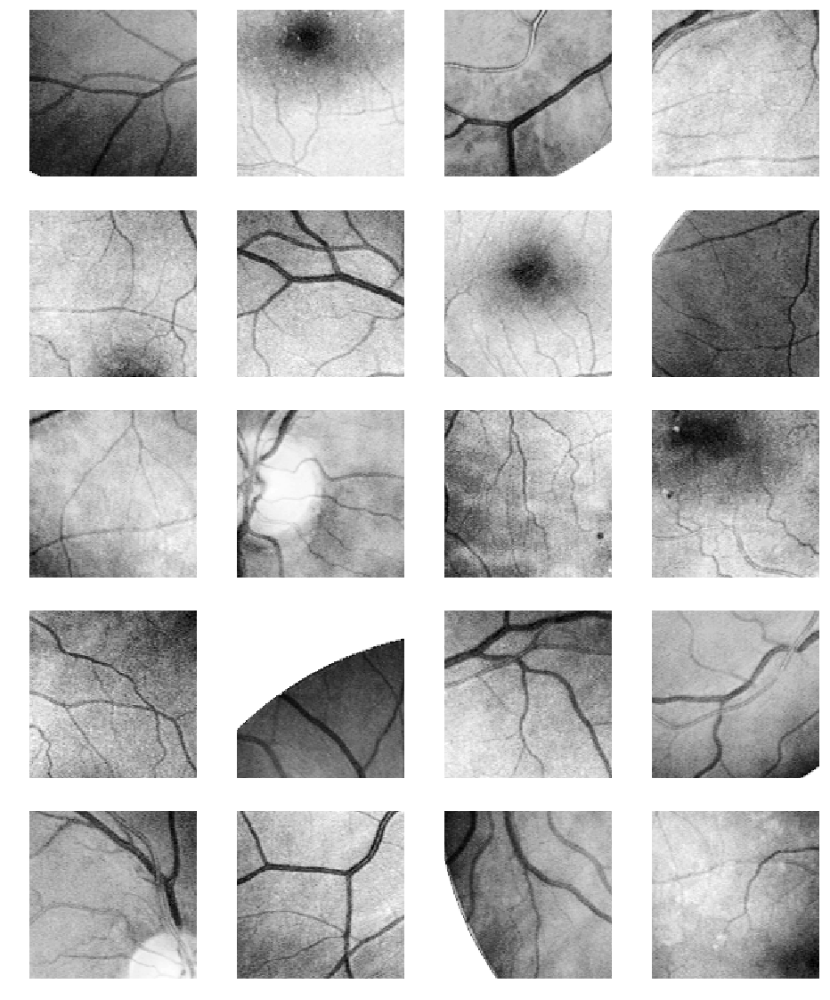

In [92]:
check = load_data('x_test_o3')
w, h = 128, 128
plot_preds_c(check)

In [41]:
pred_4 = load_data('pred_4')

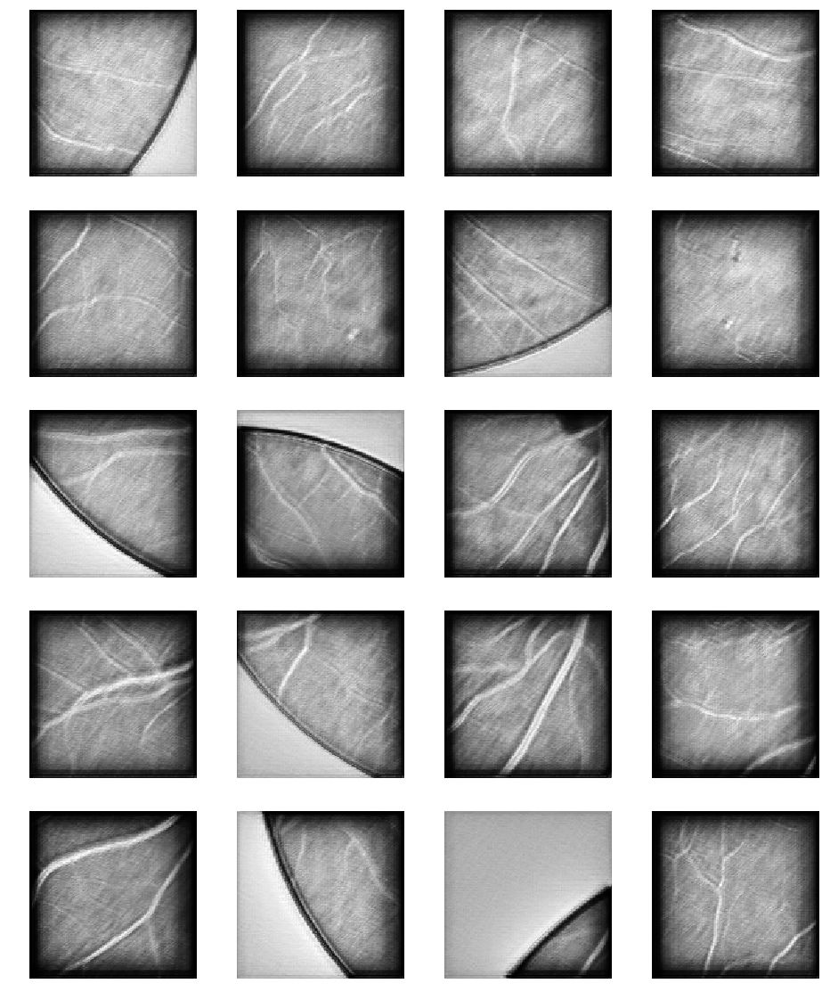

In [42]:
plot_preds_c(pred_4)

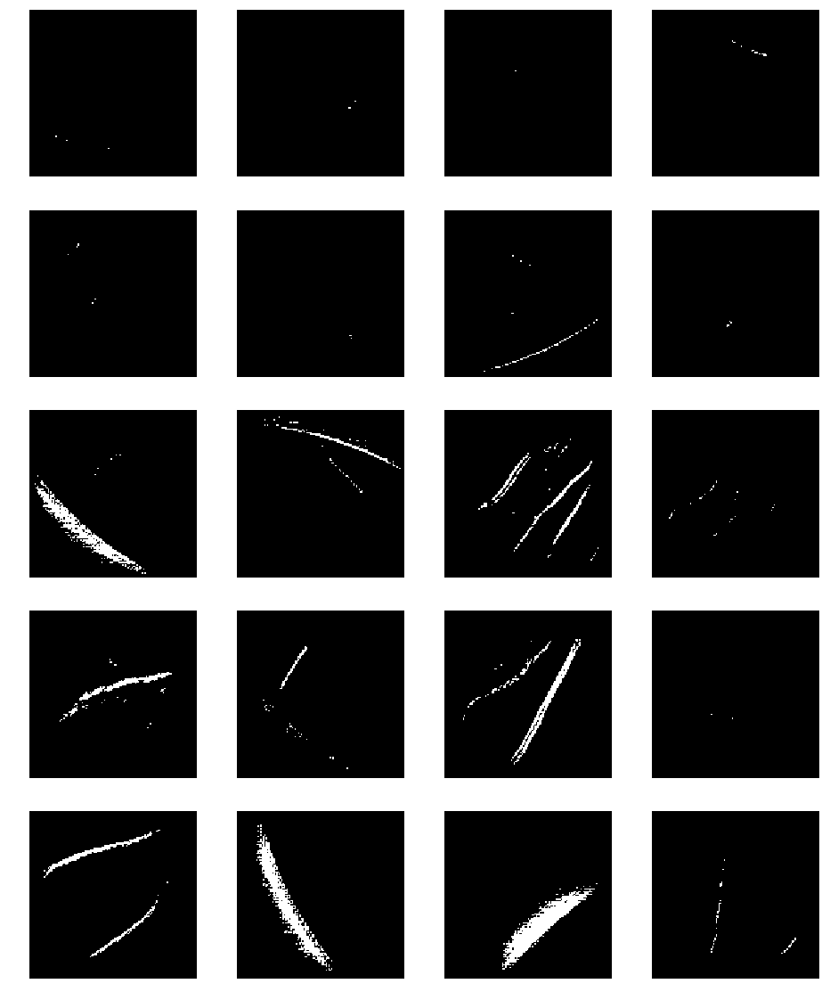

In [47]:
plot_preds_d(pred_4, 0.6)